# imports

In [1]:
import sys
sys.path.append('../')

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import torch
import glob
import os
import pickle
import matplotlib
import random

from NDNT import NDN
import NDNT.utils as utils # some other utilities
import ColorDataUtils.mattprintlib as mprint
import ColorDataUtils.mattplotlib as mplt
from ColorDataUtils.multidata_utils import MultiExperiment

class Model:
    def __init__(self):
        pass
#from models import iter_core, cnn_core

device = torch.device("cuda:1")

datadir = '/Data/ColorV1/'

%load_ext autoreload
%autoreload 2

Invoking __init__.py for NDNT.utils


# load data

In [248]:
expts = MultiExperiment(names=['J220715', 'J220722', 'J220707', 'J220801'],
                        datadir=datadir,
                        num_lags=16,
                        et_metric_thresh=0.8,
                        array_types=['UT', 'UT', 'UT', 'UT'],
                        luminance_only=True)
data, _, _ = expts.load(build_stim=True)

  FILE_INFO: stim_locsLP list again -- ok but output check
  FILE_INFO: stim_locsLP list again -- ok but output check
  Disjoint data exists with this eye_config -- trunctating to first section.
  FILE_INFO: stim_locsLP list again -- ok but output check
  Disjoint data exists with this eye_config -- trunctating to first section.
  FILE_INFO: stim_locsLP list again -- ok but output check
598080 total time steps, 882 units
J220715 68.5% fixations remaining
J220722 64.8% fixations remaining
J220707 65.3% fixations remaining
J220801 66.8% fixations remaining
  Stim expansion for shift: [900, 492, 1000, 592]
  Writing lam stim 0: overlap 60, 47
  Writing lam stim 1: overlap 60, 53
  Writing lam stim 2: overlap 33, 53
  Writing lam stim 3: overlap 33, 47
  Writing ETstim 0: overlap 7, 53
  Writing ETstim 1: overlap 7, 47
  Adding fixation point
  Shifting stim...


100%|█████████████████████████████████████████████| 34/34 [00:16<00:00,  2.03it/s]


  CROP: New stim size: 60 x 60
  Done: expt 0
  Stim expansion for shift: [906, 491, 1006, 591]
  Writing lam stim 0: overlap 60, 49
  Writing lam stim 1: overlap 60, 51
  Writing lam stim 2: overlap 32, 51
  Writing lam stim 3: overlap 32, 49
  Writing ETstim 0: overlap 11, 51
  Writing ETstim 1: overlap 11, 48
  Adding fixation point
  Shifting stim...


100%|█████████████████████████████████████████████| 24/24 [00:14<00:00,  1.65it/s]


  CROP: New stim size: 60 x 60
  Done: expt 1
  Stim expansion for shift: [905, 495, 1005, 595]
  Writing lam stim 0: overlap 60, 60
  Writing ETstim 0: overlap 41, 60
  Writing ETstim 1: overlap 60, 26
  Adding fixation point
  Shifting stim...


100%|█████████████████████████████████████████████| 28/28 [00:15<00:00,  1.81it/s]


  CROP: New stim size: 60 x 60
  Done: expt 2
  Stim expansion for shift: [906, 491, 1006, 591]
  Writing lam stim 0: overlap 60, 52
  Writing lam stim 1: overlap 60, 48
  Writing lam stim 2: overlap 30, 48
  Writing lam stim 3: overlap 30, 52
  Writing ETstim 0: overlap 9, 48
  Writing ETstim 1: overlap 9, 50
  Adding fixation point
  Shifting stim...


100%|█████████████████████████████████████████████| 36/36 [00:17<00:00,  2.03it/s]


  CROP: New stim size: 60 x 60
  Done: expt 3
Stimulus assembly complete


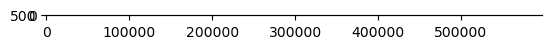

In [249]:
# plot data filters
plt.imshow(data.dfs.T)

# plot drift

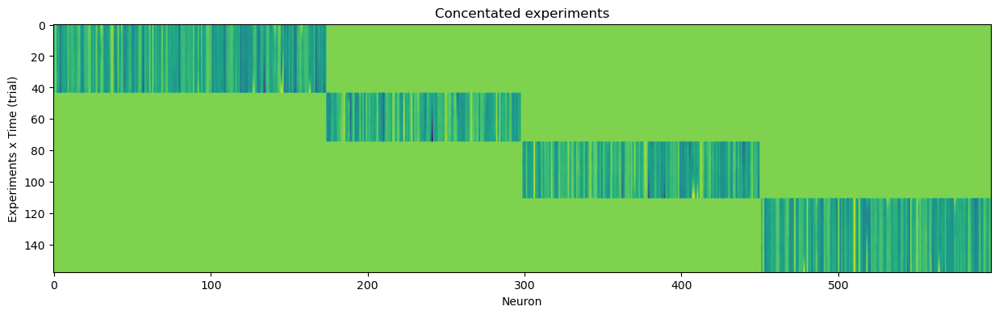

In [250]:
plt.figure(figsize=(15,4))
plt.imshow(expts.drift_terms)
plt.xlabel('Neuron')
plt.ylabel('Experiments x Time (trial)')
plt.title('Concentated experiments')
plt.show()

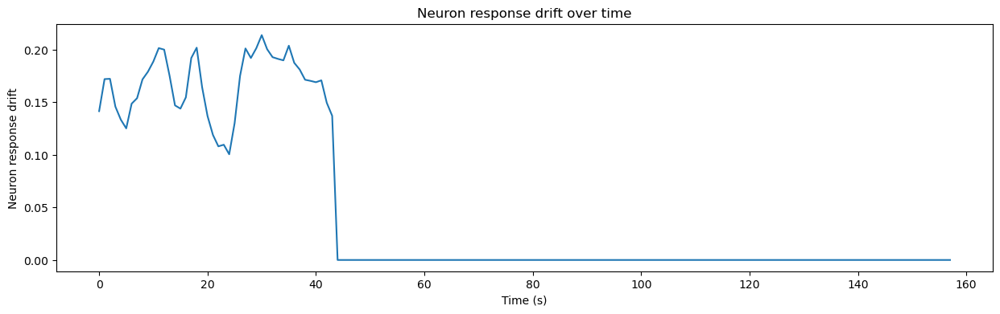

In [251]:
plt.figure(figsize=(15,4))
plt.plot(expts.drift_terms[:,1])
plt.xlabel('Time (s)')
plt.ylabel('Neuron response drift')
plt.title('Neuron response drift over time')
plt.show()

# get LLs

In [4]:
for i in range(5):
    filename = '../models/ori_sfn/model_rotated_frozenb_'+str(i)
    LLs = np.load(filename+'.npy')
    print(i, np.mean(LLs))

0 0.03127357
1 0.03011595
2 0.030856969
3 0.031472683
4 0.031119736


# plot filters

model_nlgnfilt_7.pkl 0.0319 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.0322
1 	 0.0289
2 	 0.0211
3 	 0.0452


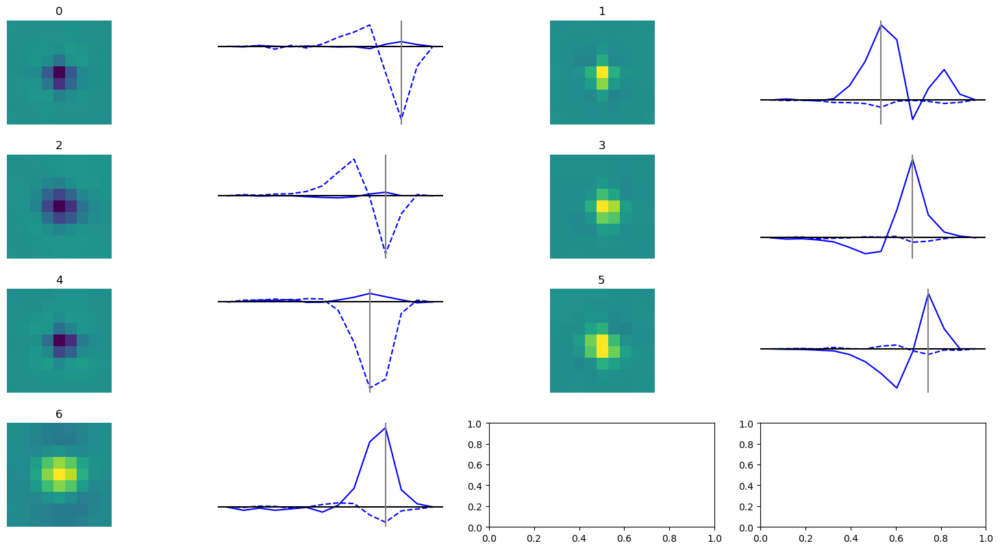

model_nlgnfilt_6.pkl 0.0318 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.0312
1 	 0.0292
2 	 0.0209
3 	 0.0458


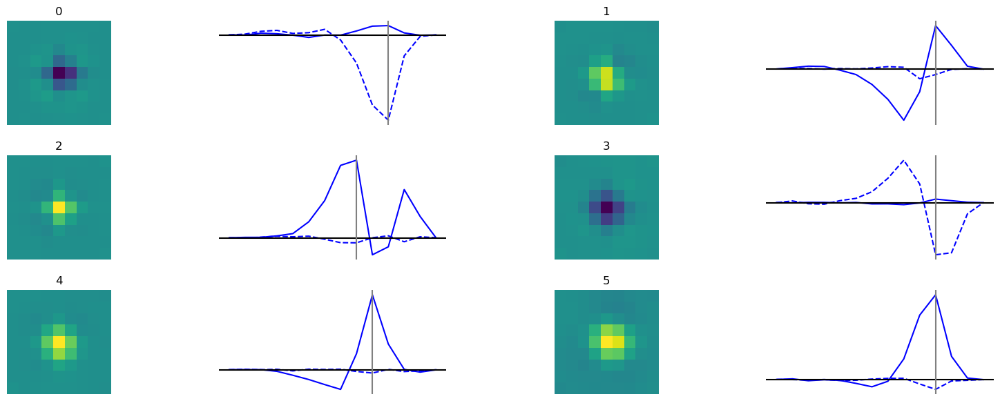

model_0.01_23_24_16_8.pkl 0.0317 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.0313
1 	 0.0291
2 	 0.0201
3 	 0.0462


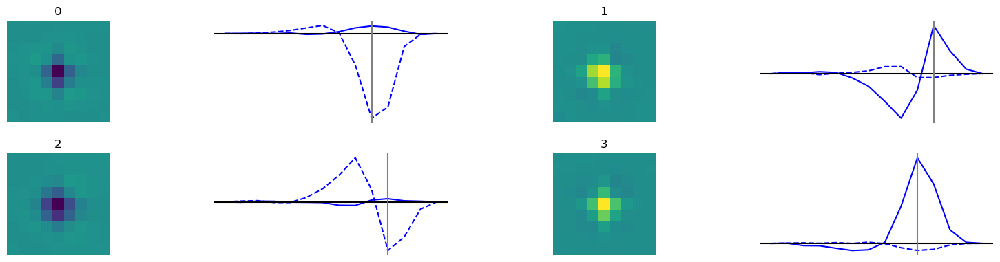

model_nlgnfilt_5.pkl 0.0304 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.0299
1 	 0.0279
2 	 0.0198
3 	 0.0439


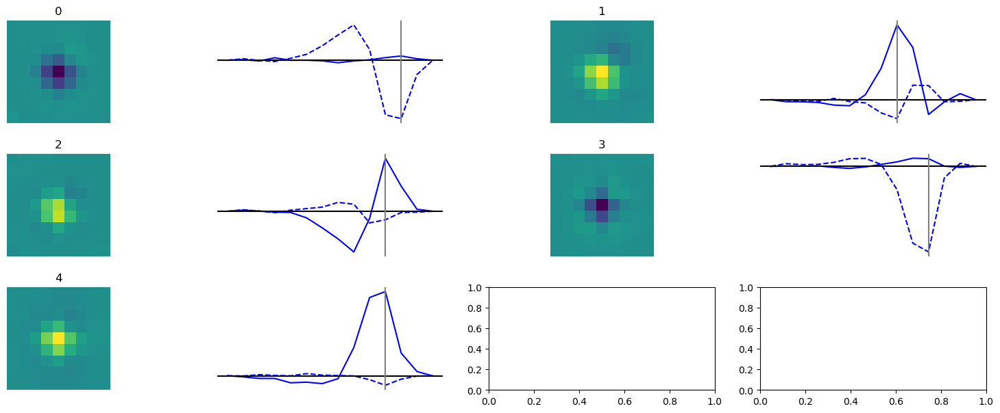

model_nlgnfilt_4.pkl 0.0298 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.0281
1 	 0.0277
2 	 0.0194
3 	 0.0441


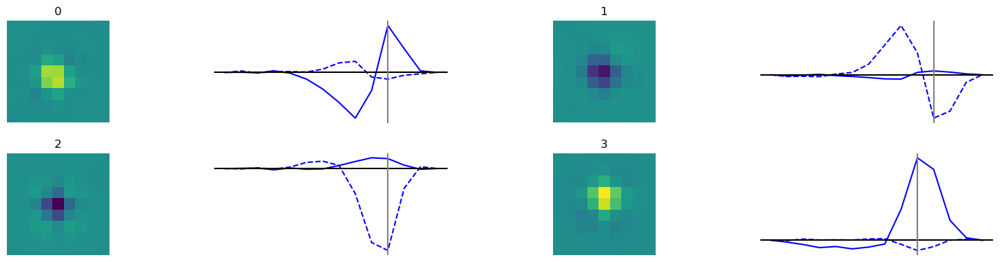

model_nlgnfilt_3.pkl 0.0292 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.0289
1 	 0.026
2 	 0.0192
3 	 0.0427


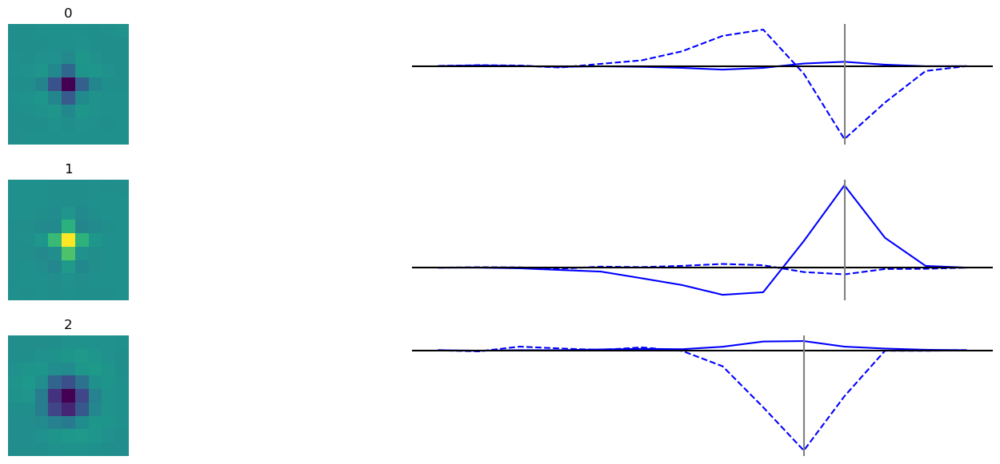

model_nlgnfilt_2.pkl 0.0245 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.0218
1 	 0.0229
2 	 0.0161
3 	 0.0377


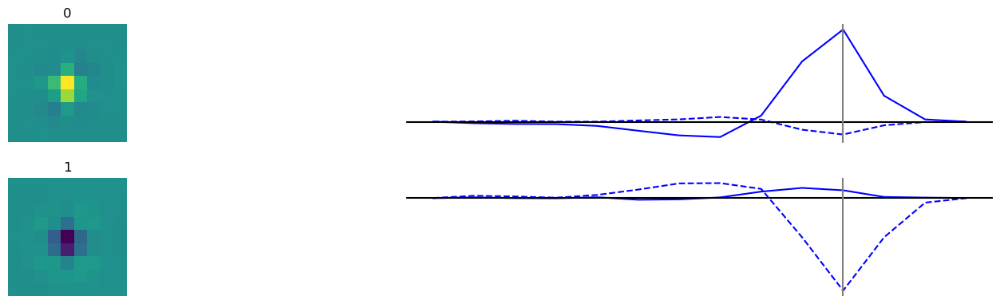

model_nlgnfilt_1.pkl 0.0233 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.021
1 	 0.0212
2 	 0.0153
3 	 0.0359


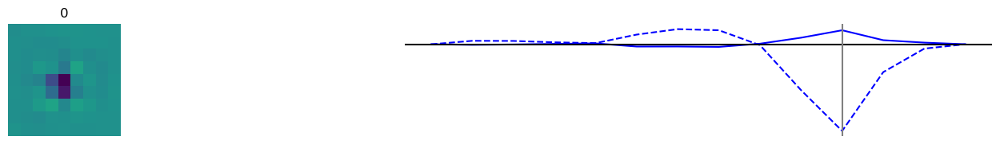

In [274]:
num_rows = 4
num_cols = 16
models = {}
for k, fname in enumerate(glob.glob('../models/ori_sfn/model_*.pkl')):
    # load LLs
    LLs = np.load(fname.split('.pkl')[0]+'.npy')
    model = NDN.load_model(fname)
    models[fname] = (model, LLs)

# print model fname and mean LL sorted by mean LL
for k, v in sorted(models.items(), key=lambda item: np.mean(item[1][1]), reverse=True)[:10]:
    #print(k, np.round(np.mean(v[1]), 4))
    # print('Expt \t LLs:')
    # for i, (start,end) in enumerate(expts.experiment_boundaries):
    #     print(i, '\t', np.round(np.mean(v[1][start:end]), 4))

    fname = k.split('/')[-1]
    model = v[0]
    LLs = v[1]

    layer_num_inhs, layer_heights, layer_bounds, readout_weights = mplt.get_readout_weights(model)
    # print(mprint.model_summary(model))
    print(os.path.basename(fname), np.round(np.mean(LLs), 4),  end=' ')
    print(model.networks[-1].layers[-1].output_dims)
    print('Expt \t LLs:')
    for i, (start,end) in enumerate(expts.experiment_boundaries):
        print(i, '\t', np.round(np.mean(LLs[start:end]), 4))
    model.plot_filters()
    plt.show()
    #mplt.plot_proj_filters(model, num_cols=10, figsize=(20,10), sample='all', verbose=False)
    #mplt.plot_proj_heatmap(model, cell=1, figsize=(20,10), verbose=False)
    # mplt.plot_readout_weights(model, group_orientations=True)
    # proj_shape = model.networks[0].layers[1].get_weights().shape
    # for i in range(proj_shape[0]):
    #     rows,cols = (3,7)
    #     for j in range(proj_shape[3]):
    #         im = model.networks[0].layers[1].get_weights()[i,:,:,j]
    #         plt.imsave('orientation_filters/ori_09a_{:02d}_{:01d}_{:02d}.png'.format(k,i,j), im)
    #print('---------------------------------')

model_0.0001_23_24_16_12.pkl 0.0323 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.0317
1 	 0.0299
2 	 0.0212
3 	 0.0463


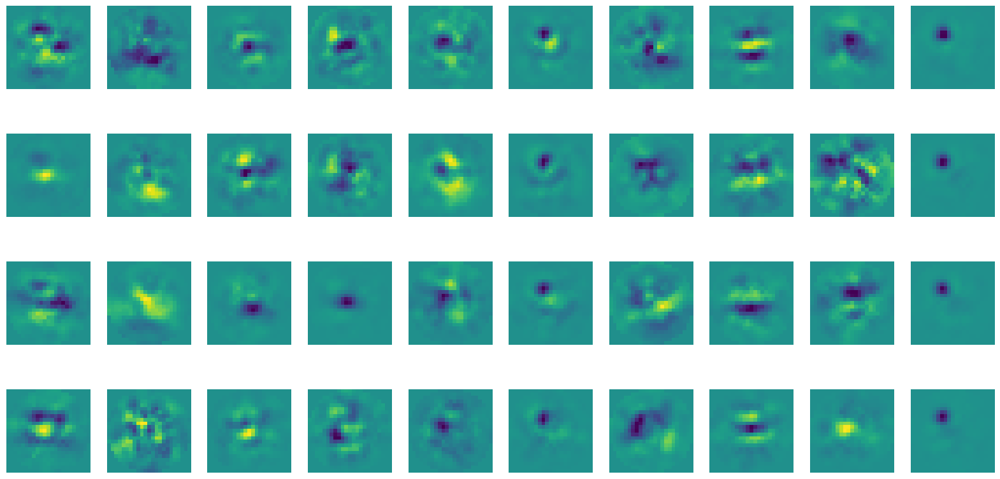

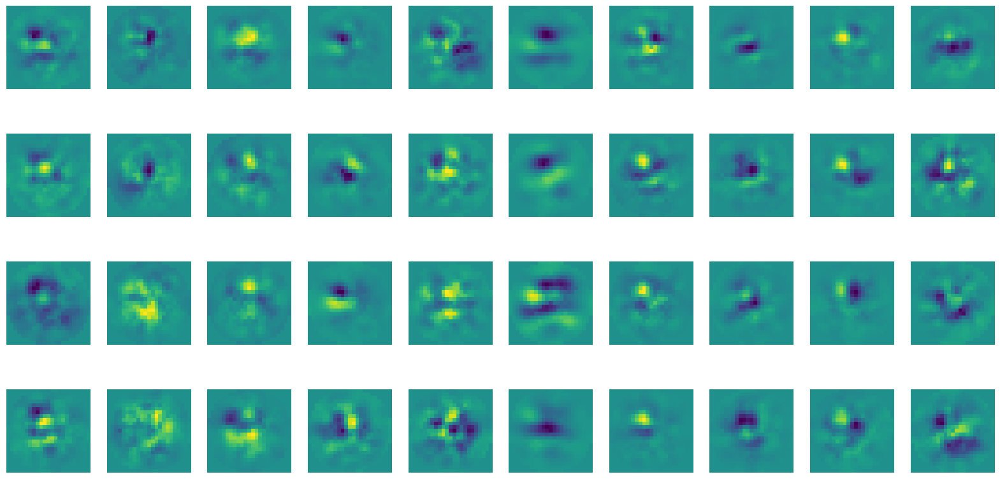

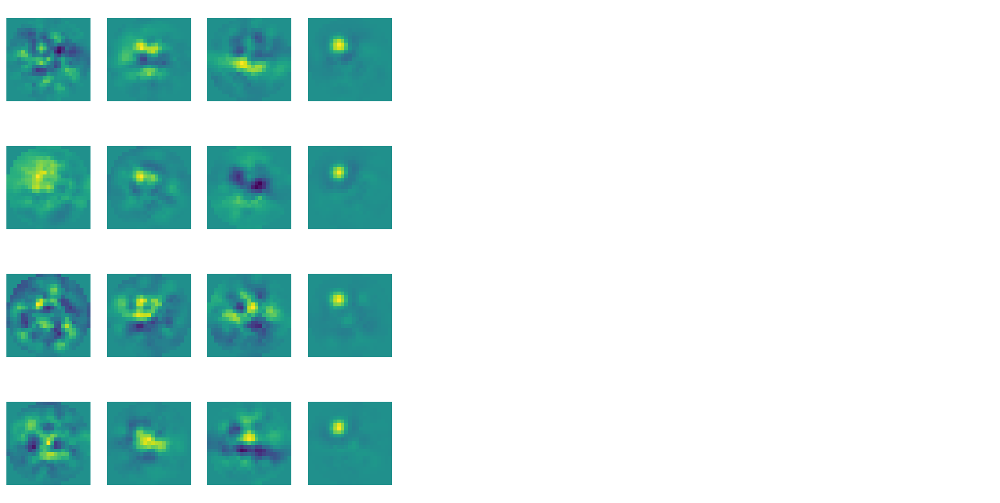

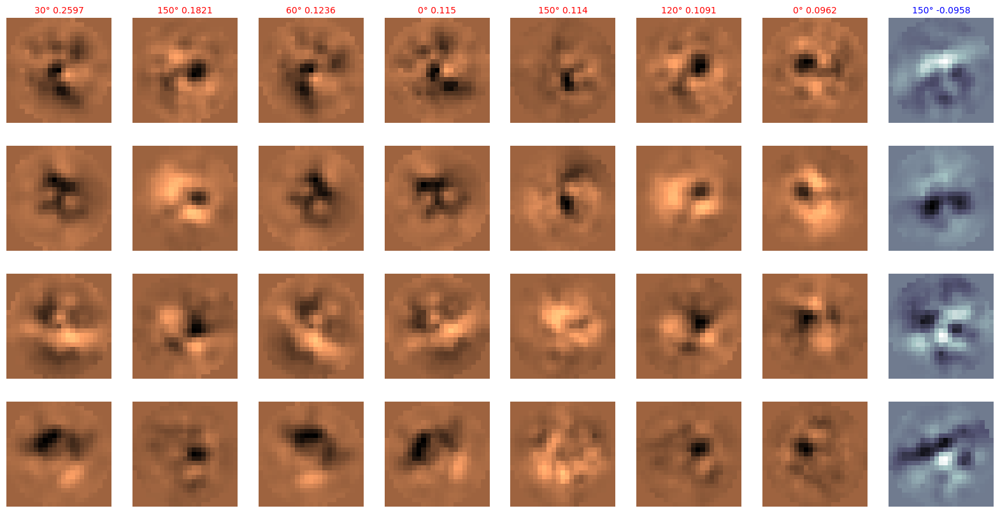

model_0.001_21_24_16_12.pkl 0.0322 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.0315
1 	 0.0293
2 	 0.0213
3 	 0.0463


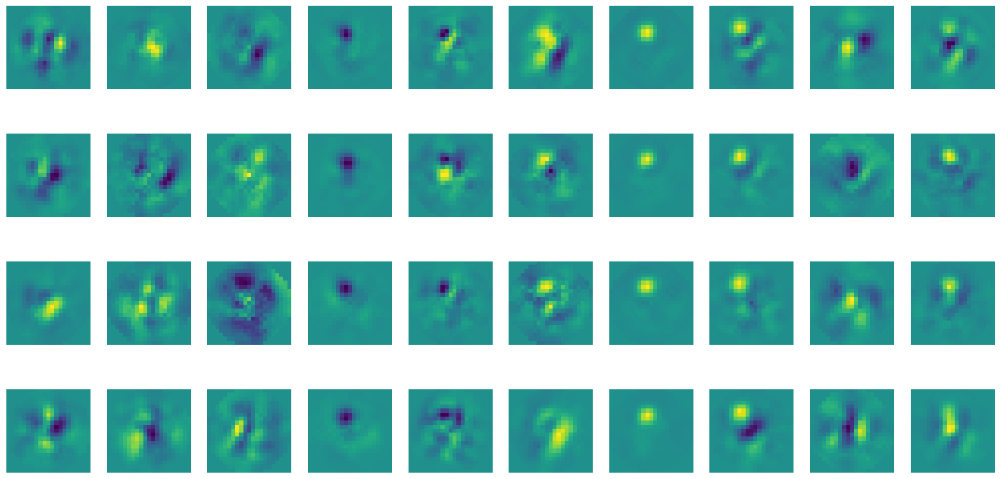

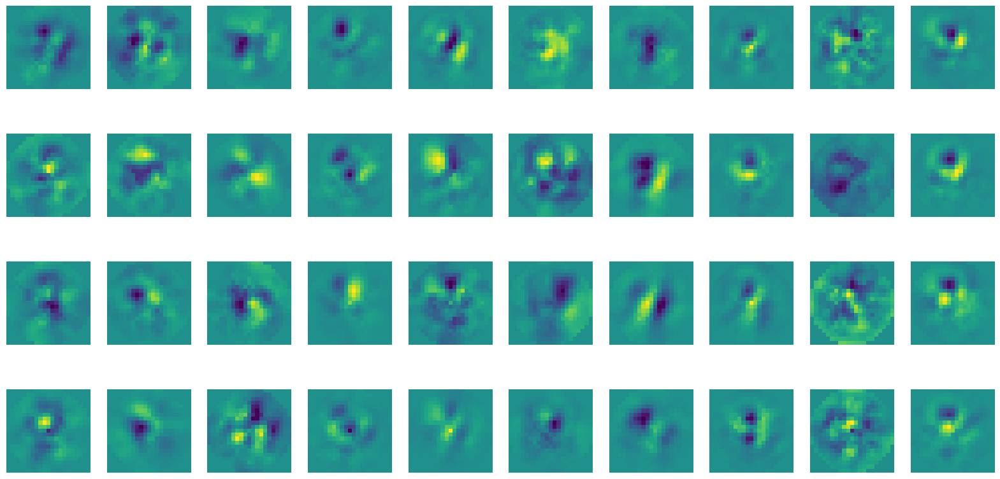

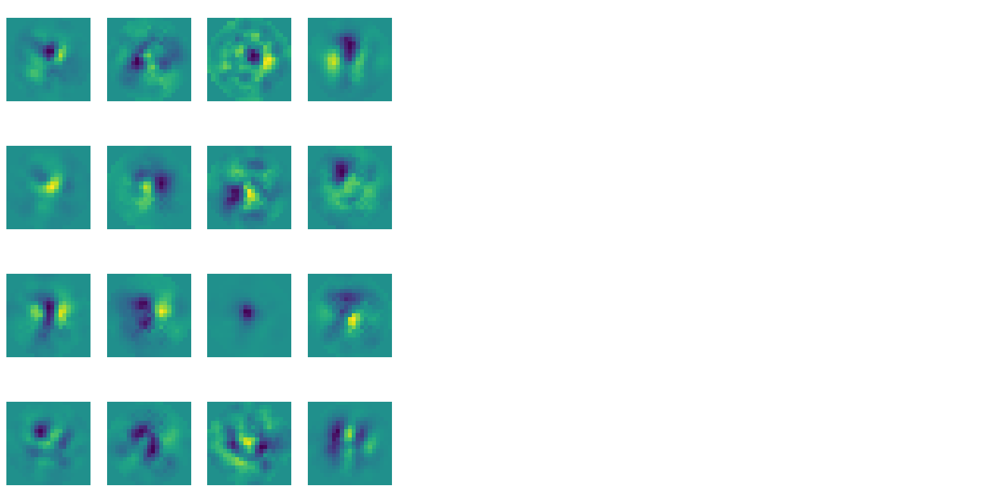

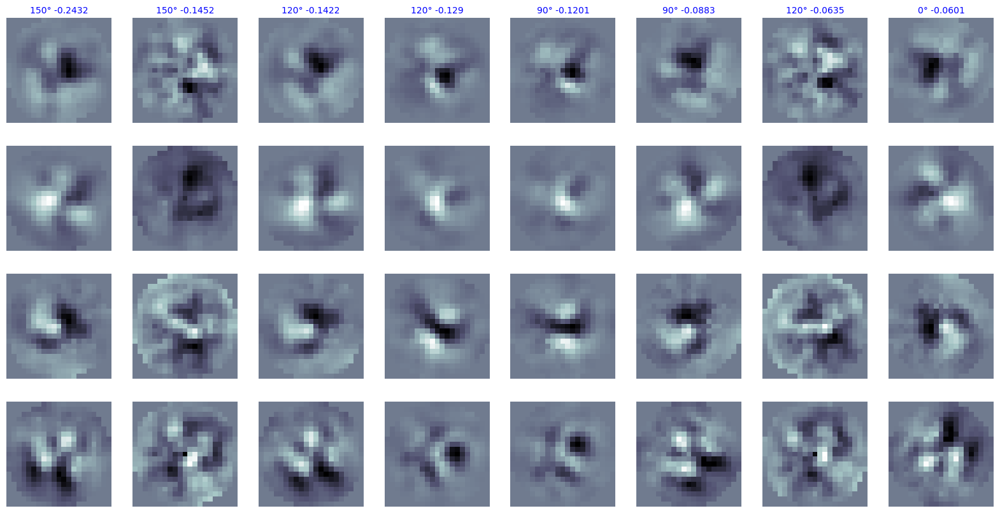

model_0.001_23_24_16_12.pkl 0.0321 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.0315
1 	 0.029
2 	 0.0213
3 	 0.0465


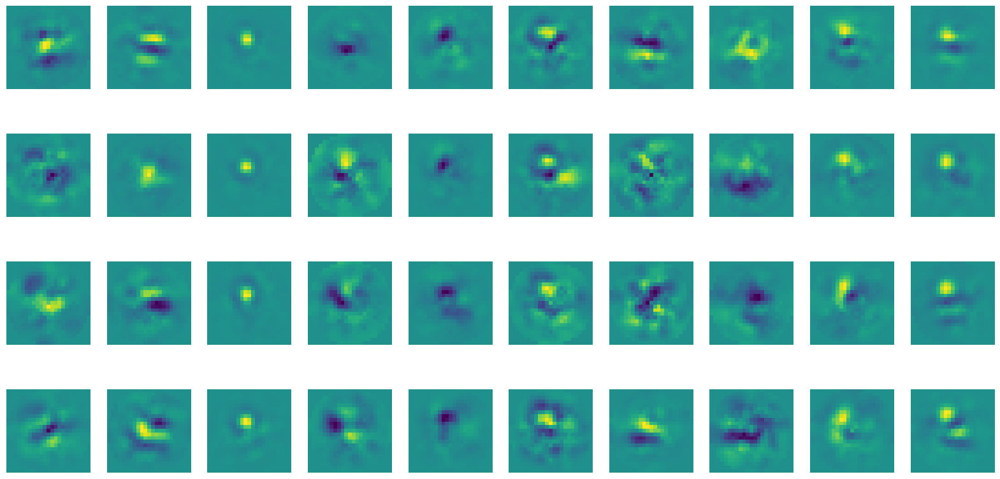

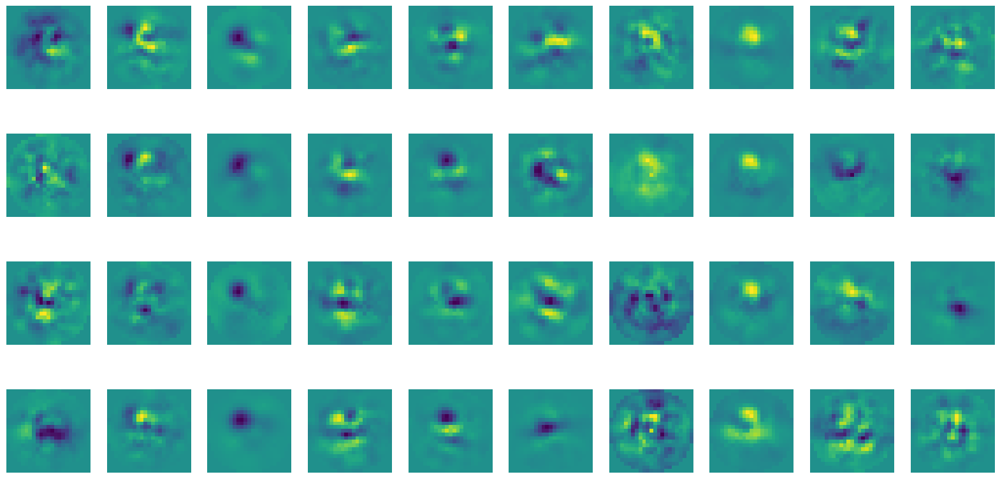

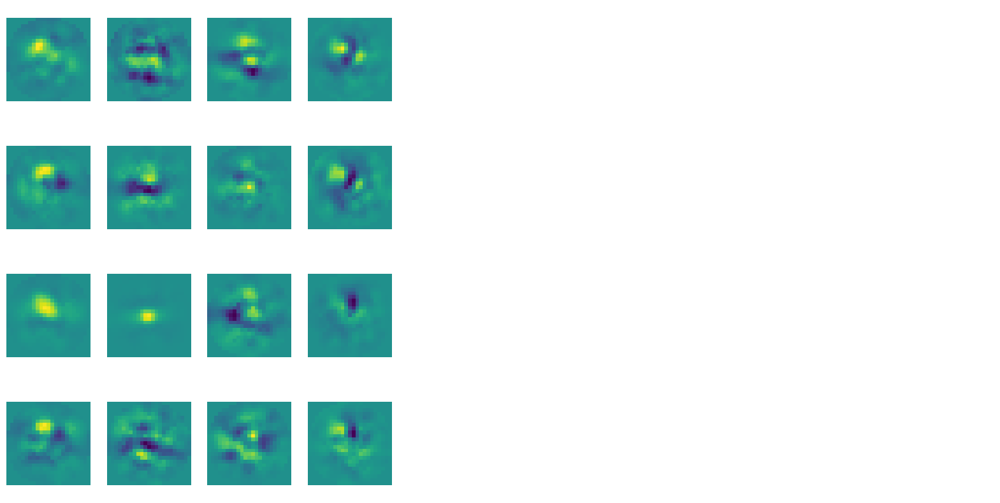

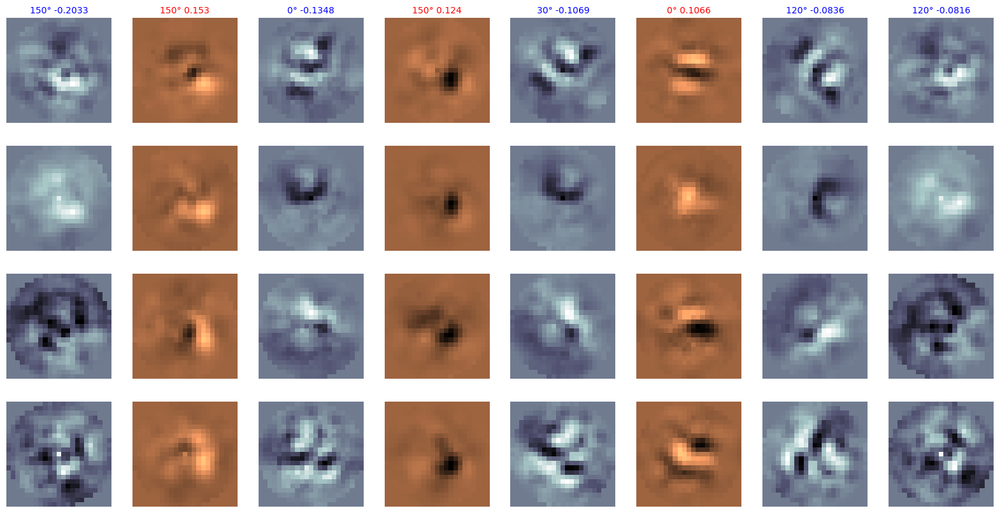

model_0.01_23_24_16_8.pkl 0.0317 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.0313
1 	 0.0291
2 	 0.0201
3 	 0.0462


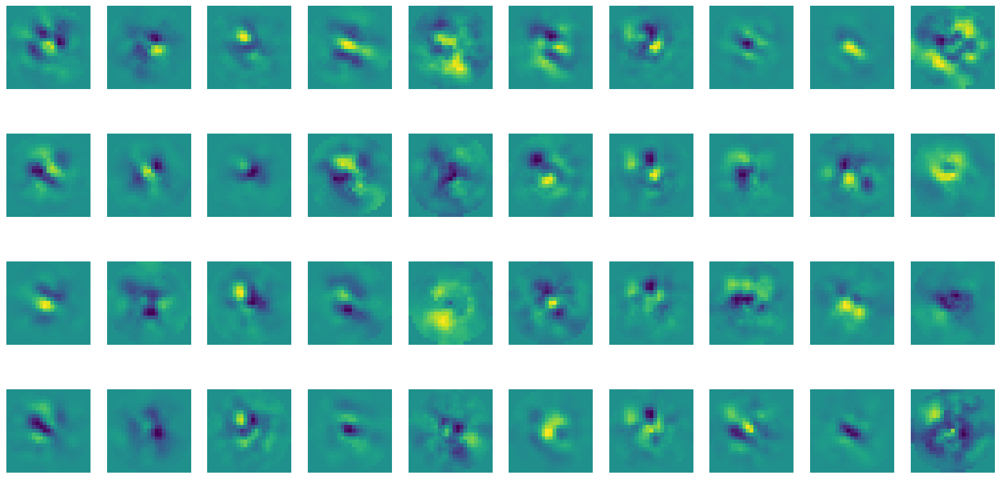

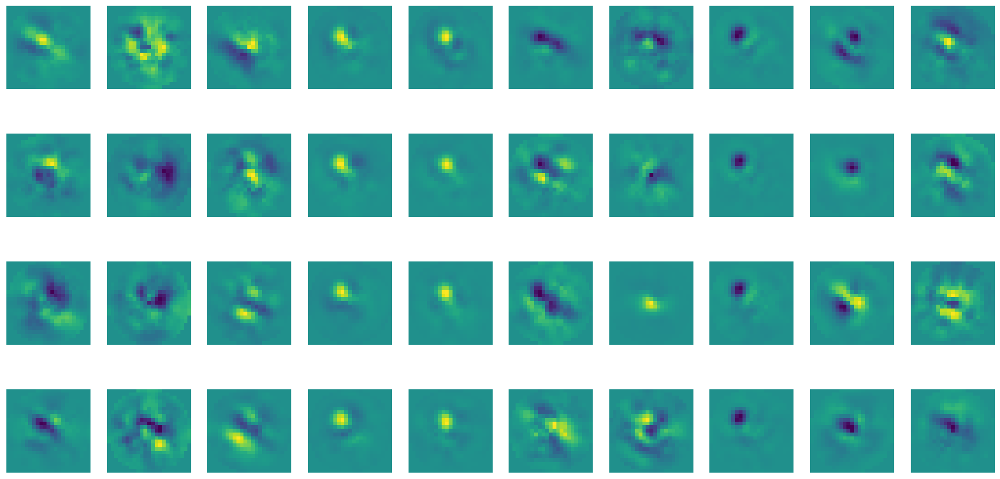

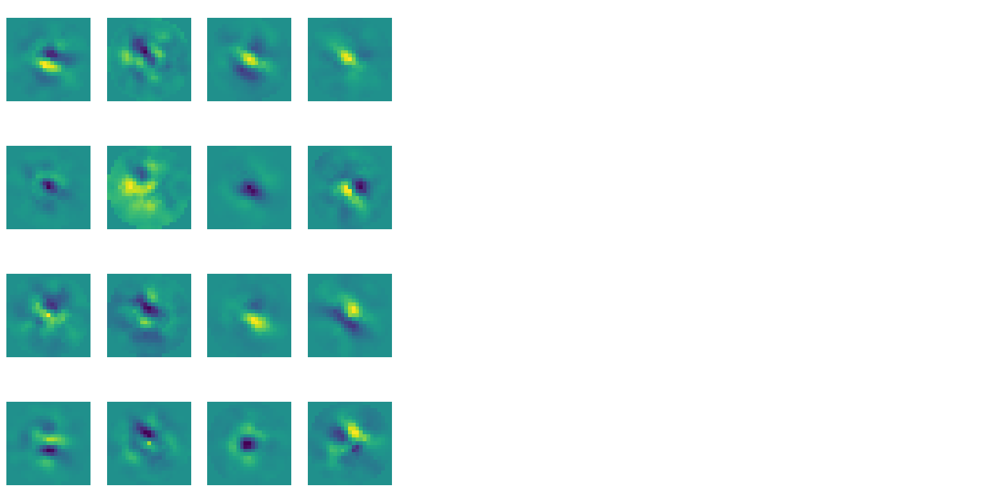

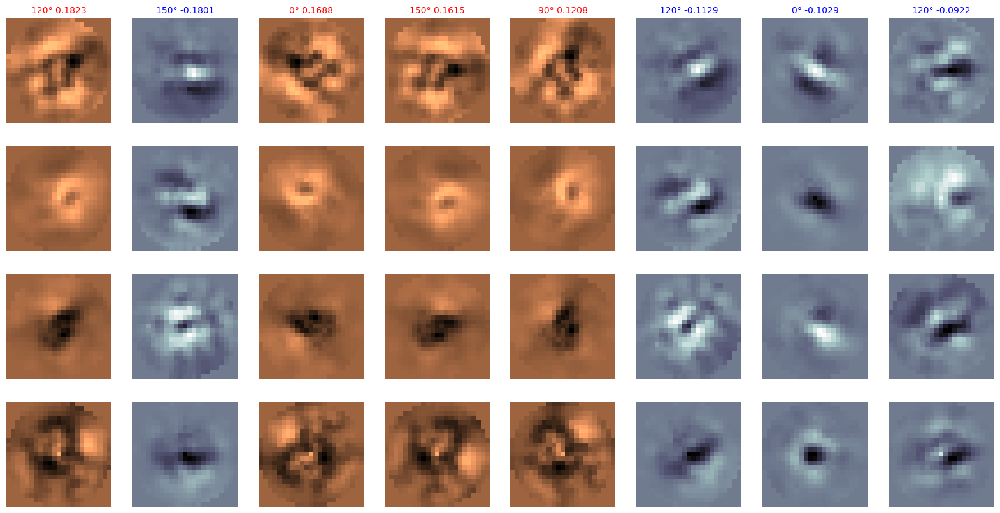

model_0.01_23_20_16_12.pkl 0.0317 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.0308
1 	 0.0289
2 	 0.0209
3 	 0.0461


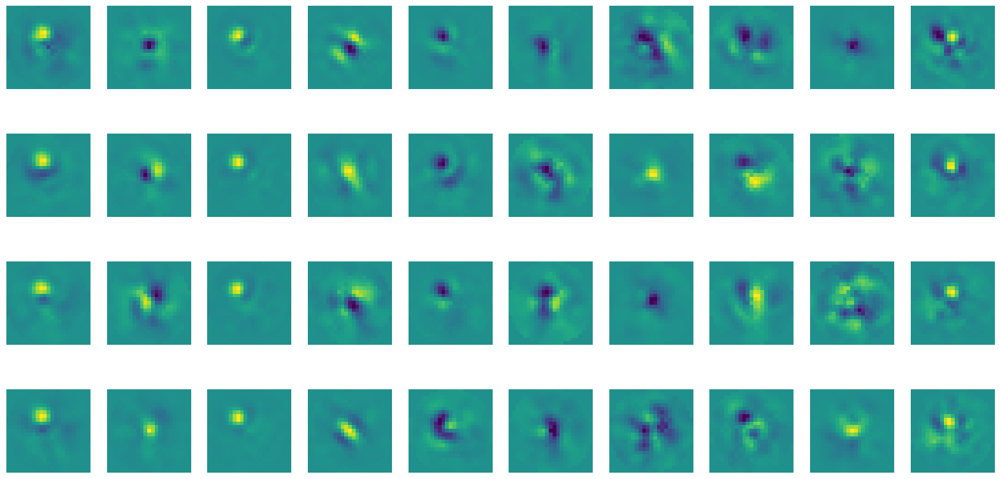

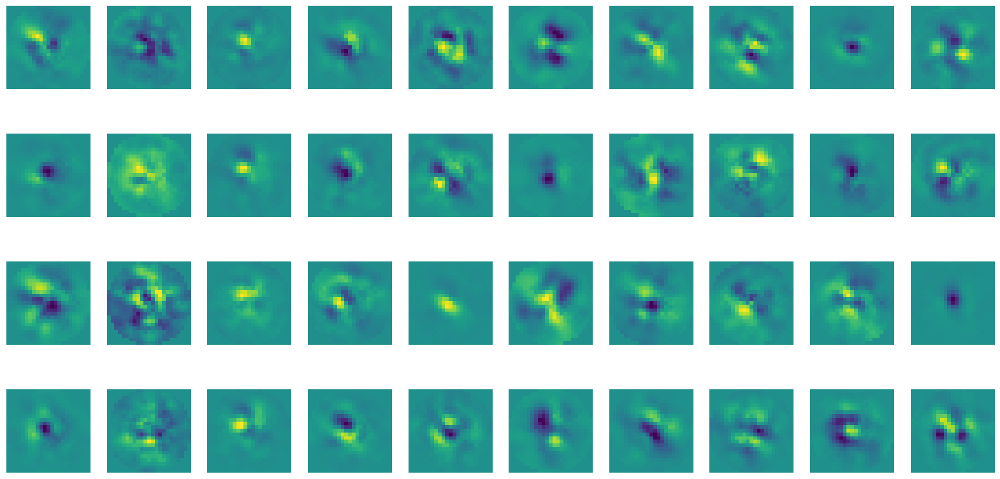

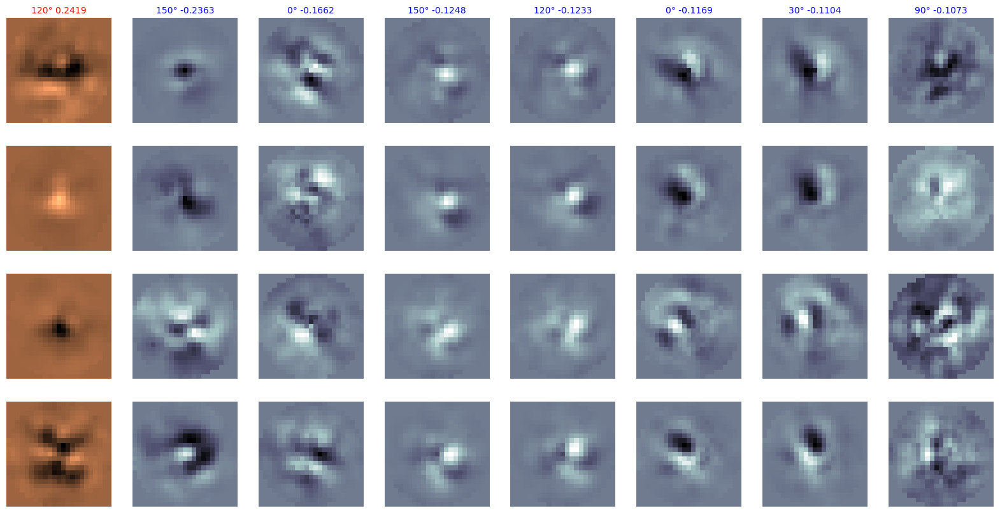

model_0.0001_17_24_16_12.pkl 0.0316 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.0312
1 	 0.029
2 	 0.0208
3 	 0.0454


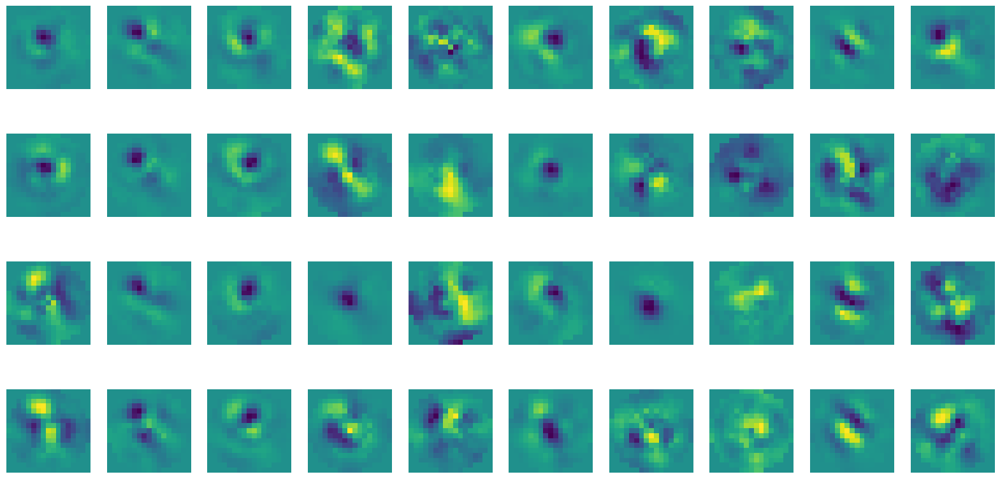

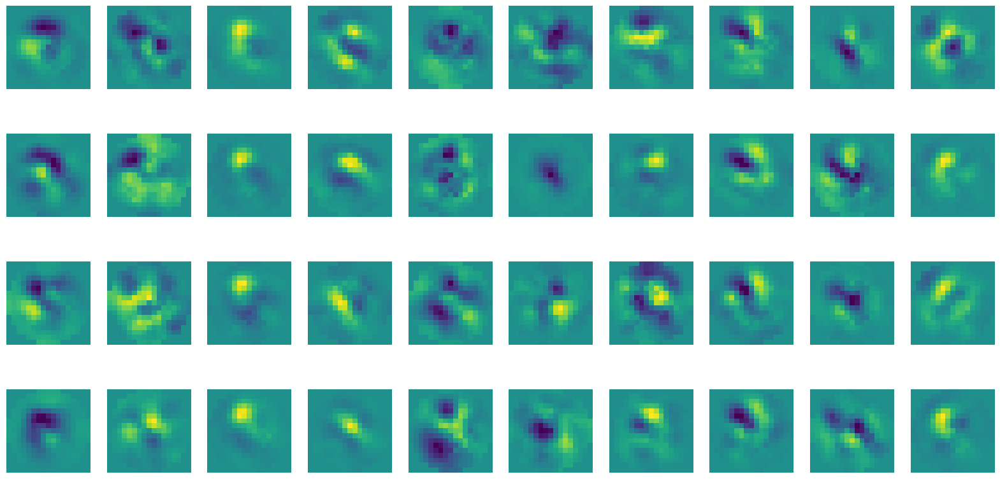

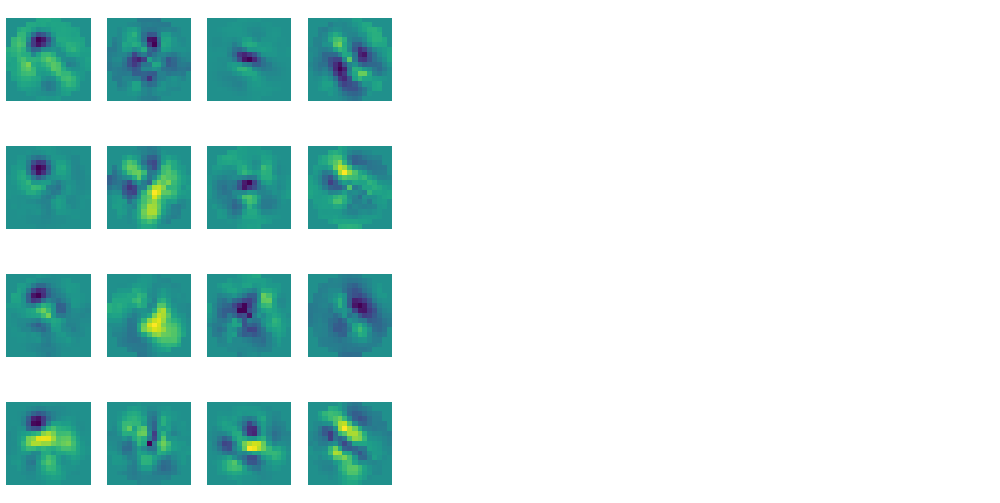

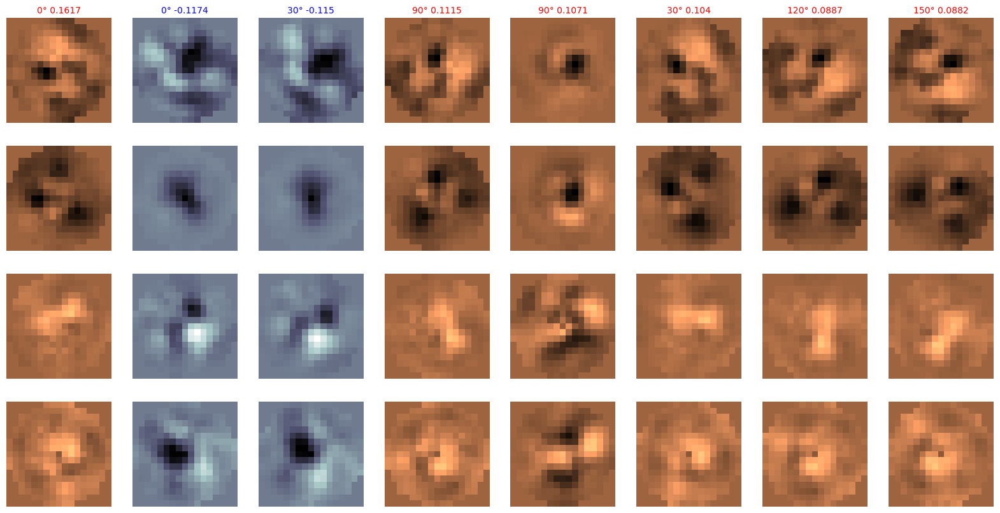

model_0.0001_19_20_16_12.pkl 0.0316 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.0313
1 	 0.0289
2 	 0.0206
3 	 0.0454


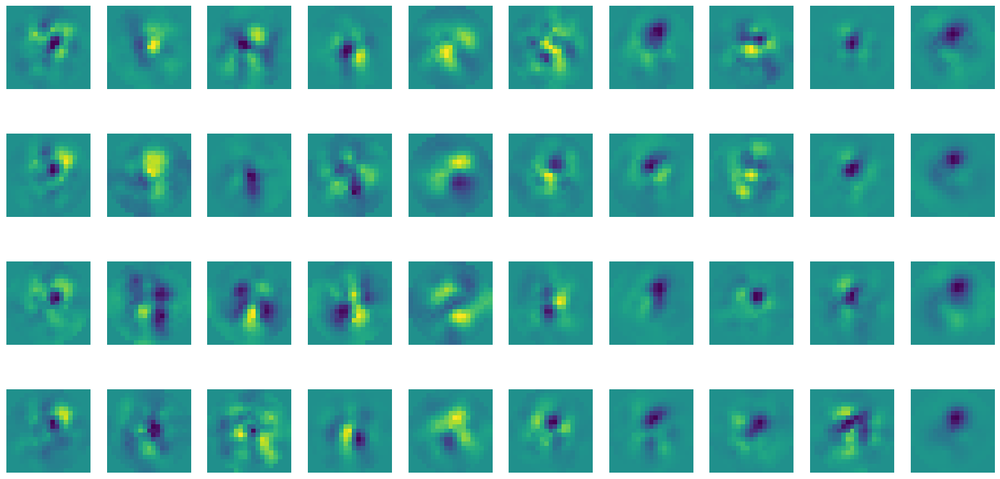

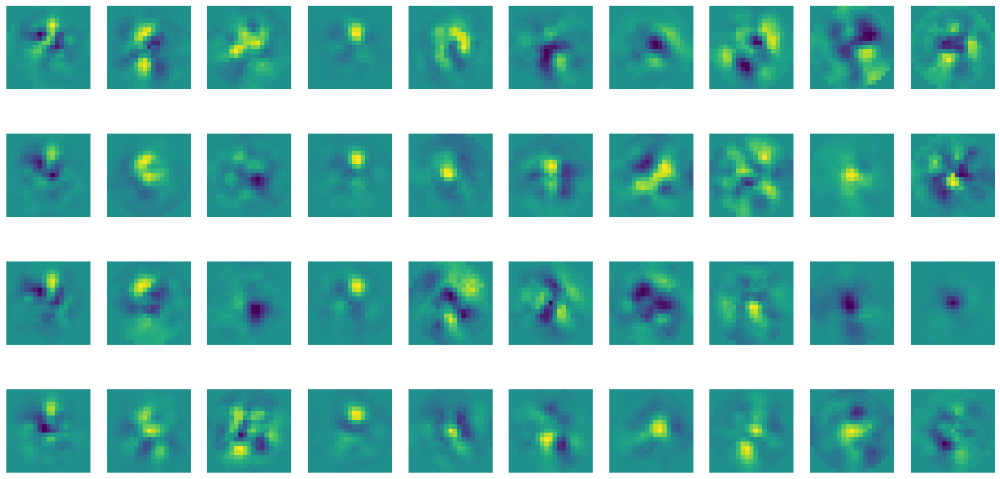

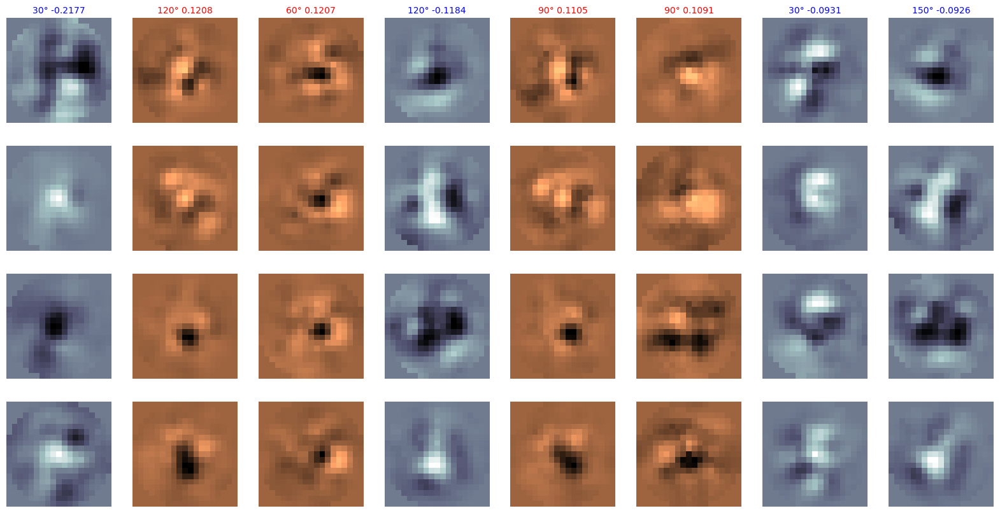

model_0.01_17_24_16_8.pkl 0.0315 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.0315
1 	 0.0285
2 	 0.0206
3 	 0.0454


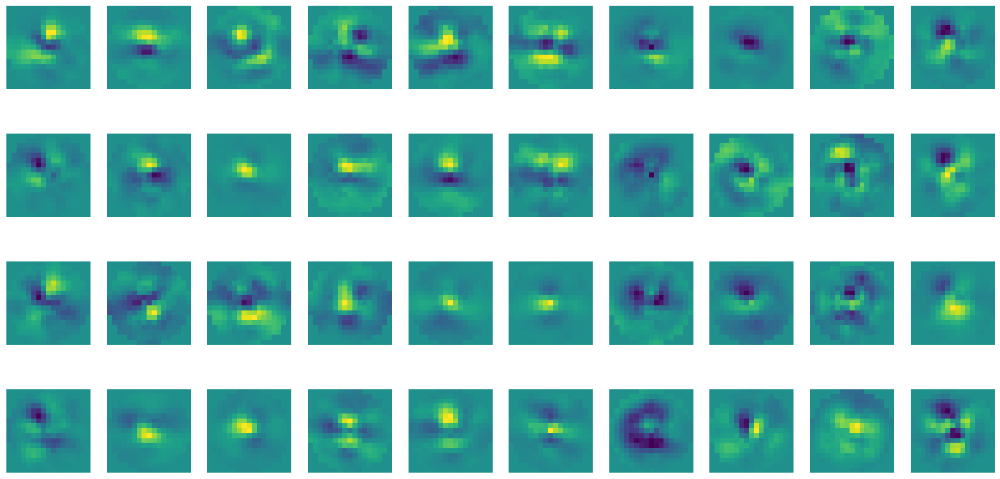

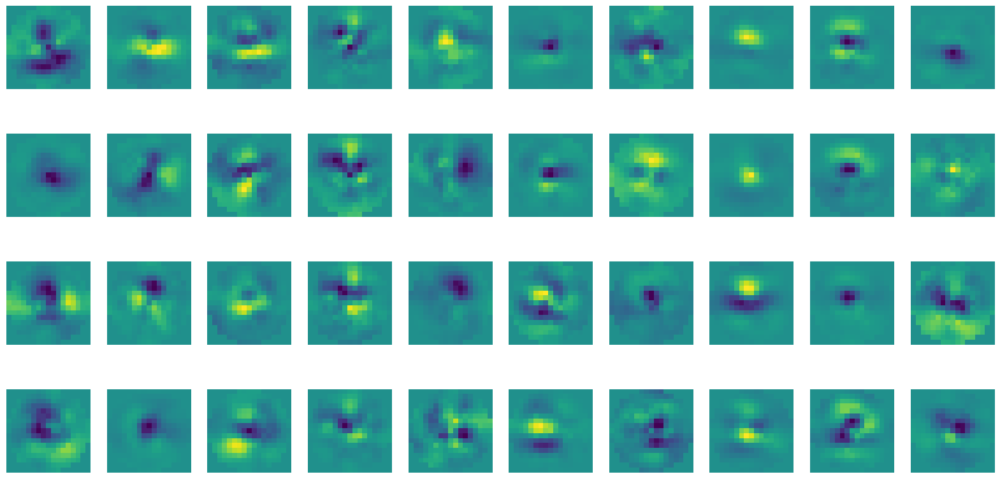

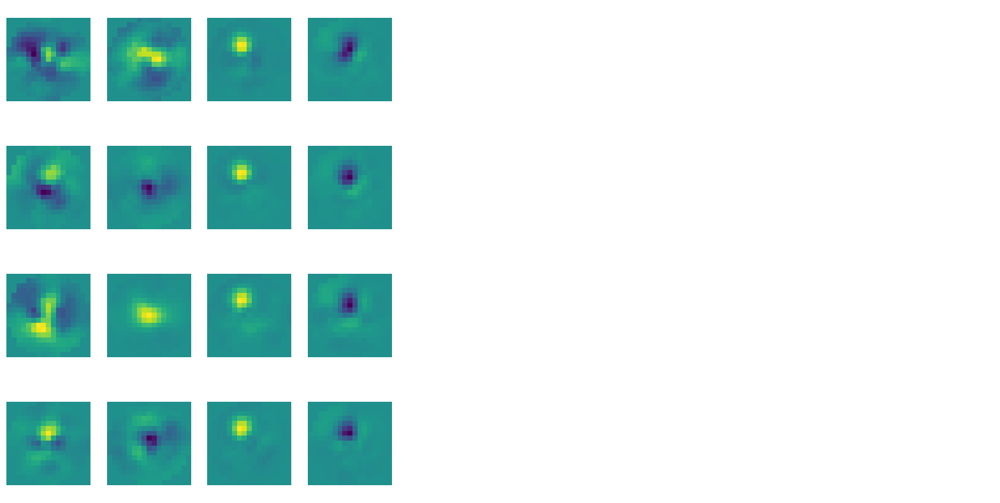

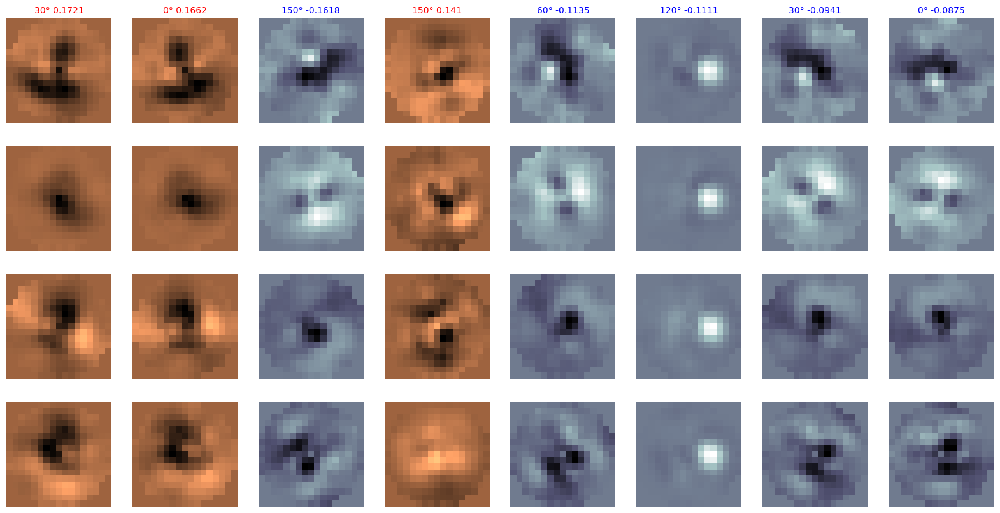

model_0.01_23_24_16_12.pkl 0.0315 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.0313
1 	 0.0285
2 	 0.0199
3 	 0.0461


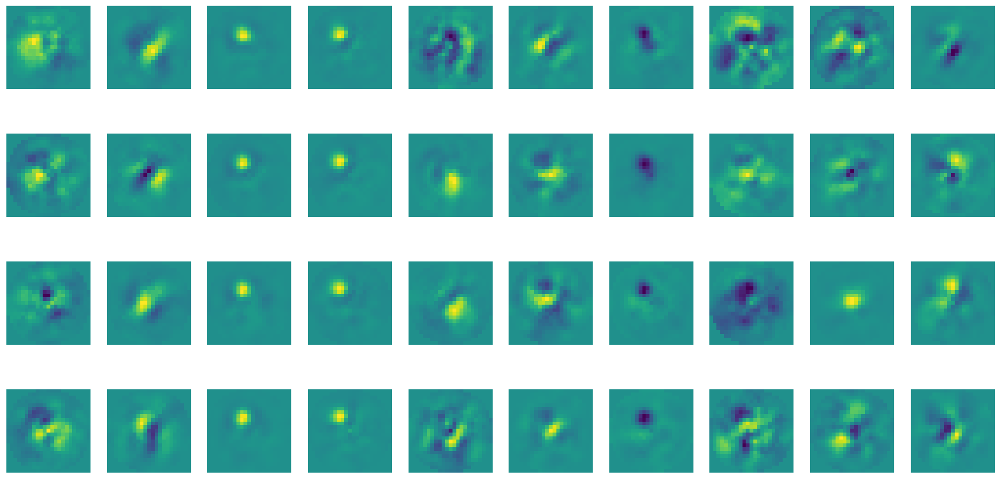

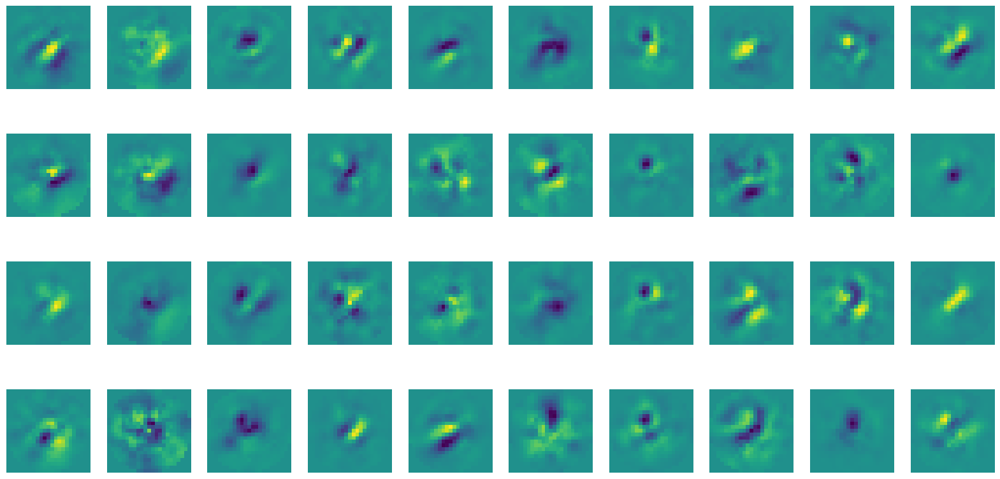

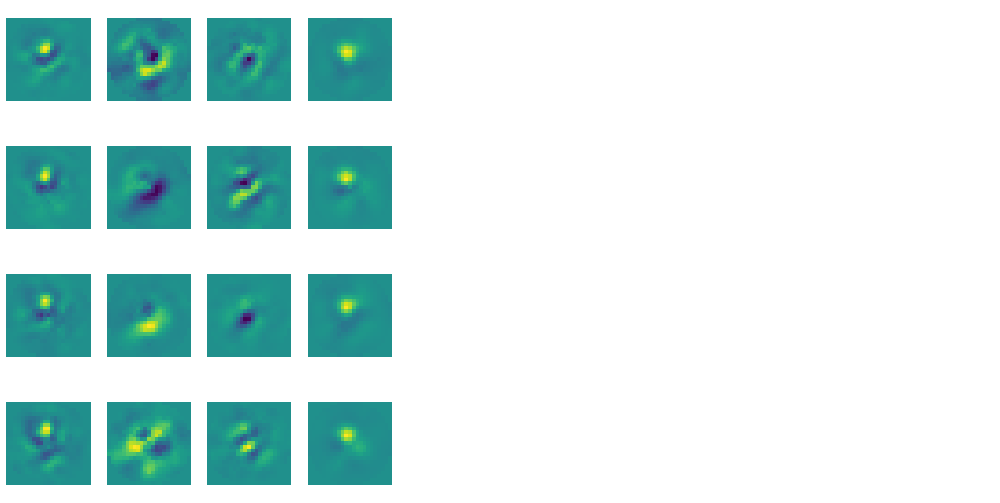

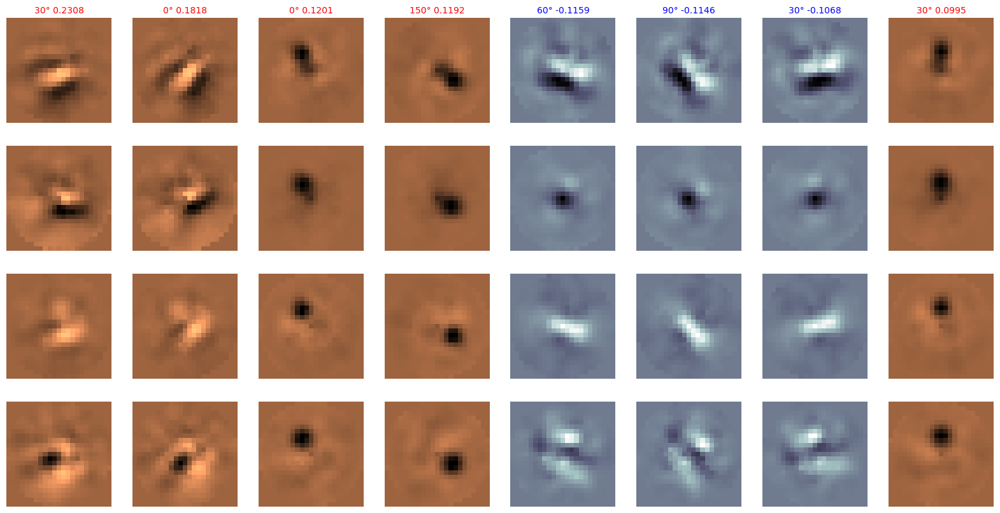

model_0.01_19_24_16_8.pkl 0.0313 [598, 1, 1, 1]
Expt 	 LLs:
0 	 0.031
1 	 0.0279
2 	 0.0208
3 	 0.0451


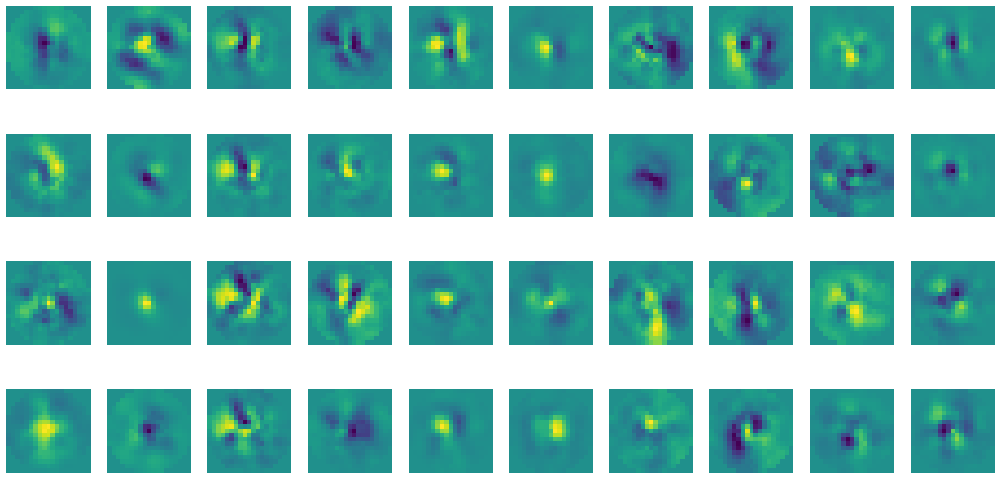

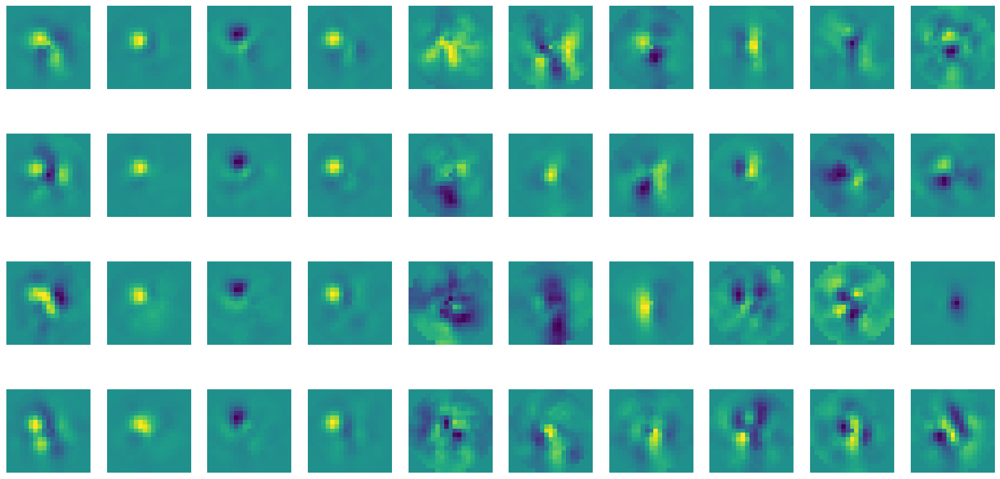

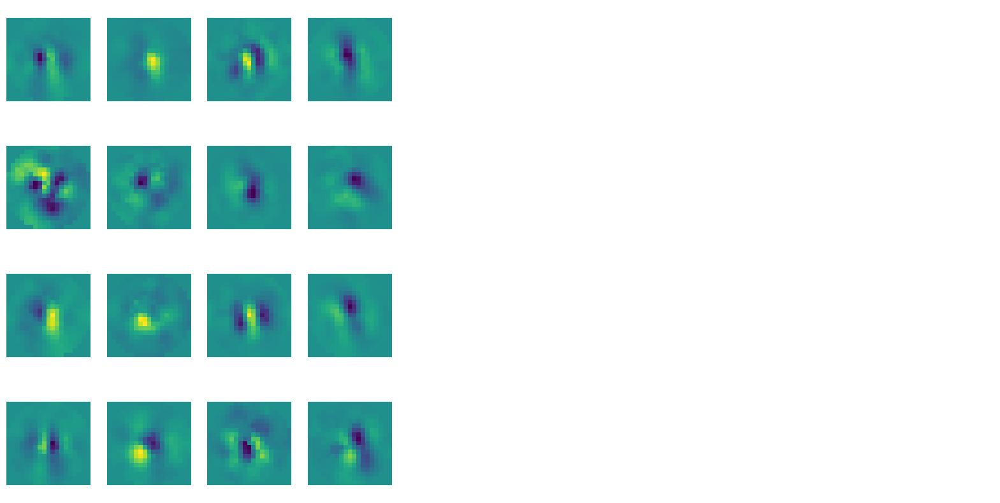

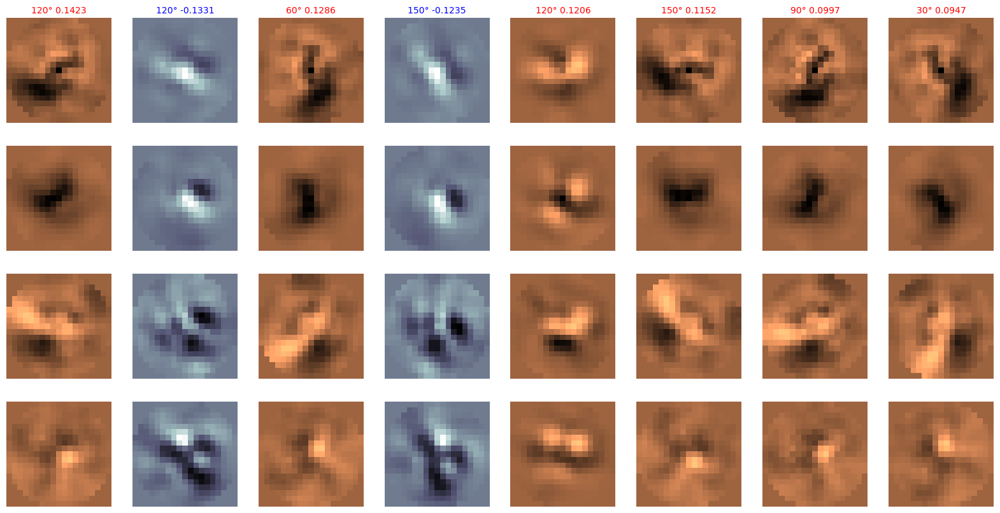

In [269]:
num_rows = 4
num_cols = 16
models = {}
for k, fname in enumerate(glob.glob('../models/ori_09a/model_*.pkl')):
    # load LLs
    LLs = np.load(fname.split('.pkl')[0]+'.npy')
    model = NDN.load_model(fname)
    models[fname] = (model, LLs)

# print model fname and mean LL sorted by mean LL
for k, v in sorted(models.items(), key=lambda item: np.mean(item[1][1]), reverse=True)[:10]:
    #print(k, np.round(np.mean(v[1]), 4))
    # print('Expt \t LLs:')
    # for i, (start,end) in enumerate(expts.experiment_boundaries):
    #     print(i, '\t', np.round(np.mean(v[1][start:end]), 4))

    fname = k.split('/')[-1]
    model = v[0]
    LLs = v[1]

    layer_num_inhs, layer_heights, layer_bounds, readout_weights = mplt.get_readout_weights(model)
    # print(mprint.model_summary(model))
    #model.plot_filters()
    print(os.path.basename(fname), np.round(np.mean(LLs), 4),  end=' ')
    print(model.networks[-1].layers[-1].output_dims)
    print('Expt \t LLs:')
    for i, (start,end) in enumerate(expts.experiment_boundaries):
        print(i, '\t', np.round(np.mean(LLs[start:end]), 4))
    mplt.plot_proj_filters(model, num_cols=10, figsize=(20,10), sample='all', verbose=False)
    mplt.plot_proj_heatmap(model, cell=1, figsize=(20,10), verbose=False)
    # mplt.plot_readout_weights(model, group_orientations=True)
    # proj_shape = model.networks[0].layers[1].get_weights().shape
    # for i in range(proj_shape[0]):
    #     rows,cols = (3,7)
    #     for j in range(proj_shape[3]):
    #         im = model.networks[0].layers[1].get_weights()[i,:,:,j]
    #         plt.imsave('orientation_filters/ori_09a_{:02d}_{:01d}_{:02d}.png'.format(k,i,j), im)
    #print('---------------------------------')

# channel figures

In [123]:
#model = NDN.load_model('../models/ori_09a/model_0.0001_23_24_16_12.pkl')
model = NDN.load_model('../models/ori_09a/model_0.0001_17_24_16_12.pkl')

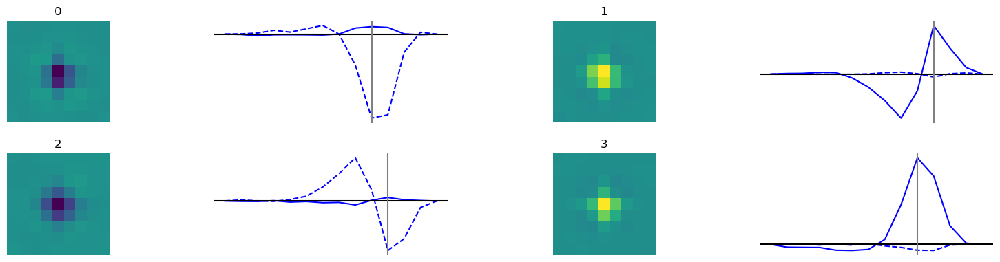

In [124]:
model.plot_filters()

weights (4, 17, 17, 24)


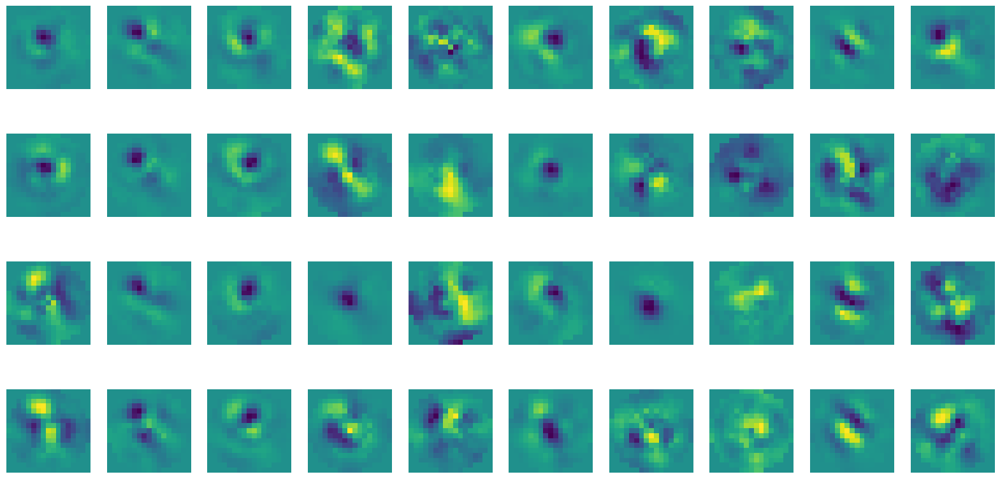

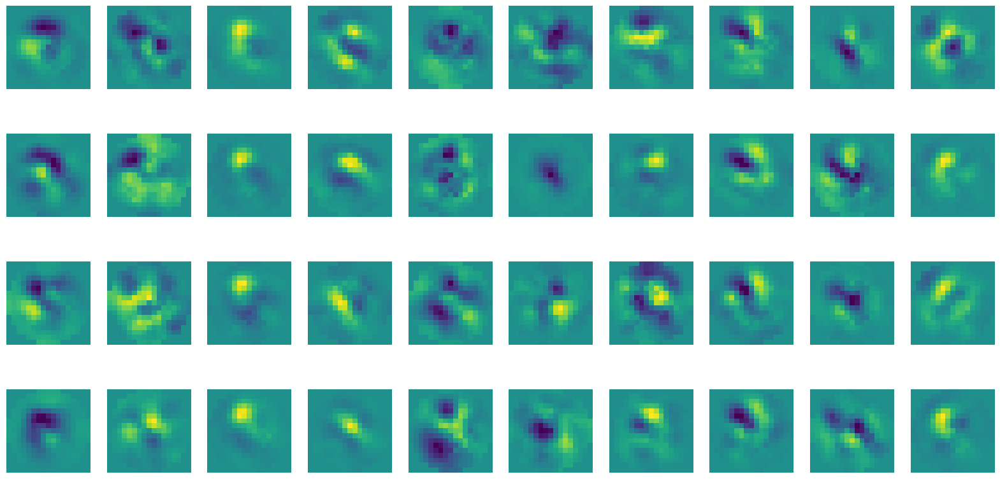

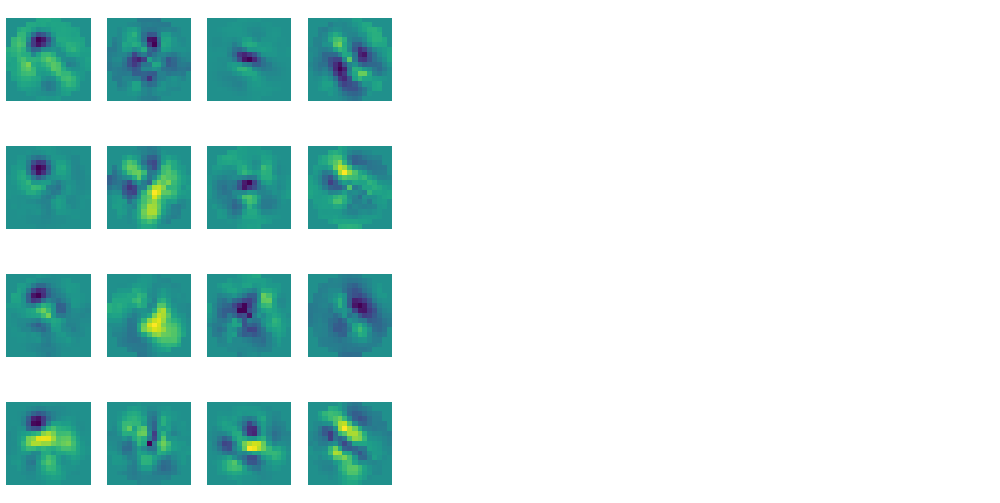

In [125]:
mplt.plot_proj_filters(model, num_cols=10, figsize=(20,10), sample='all', verbose=True)

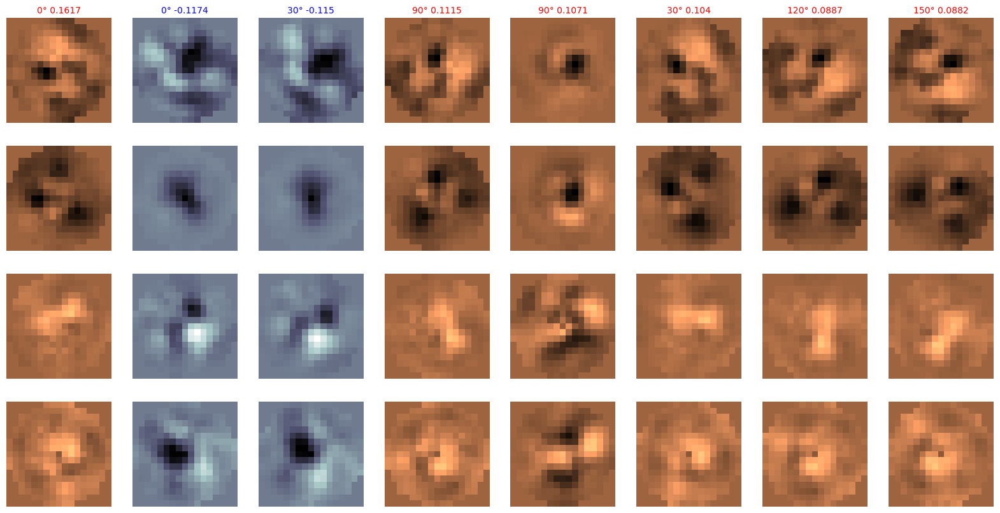

In [138]:
mplt.plot_proj_heatmap(model, cell=1, figsize=(20,10))

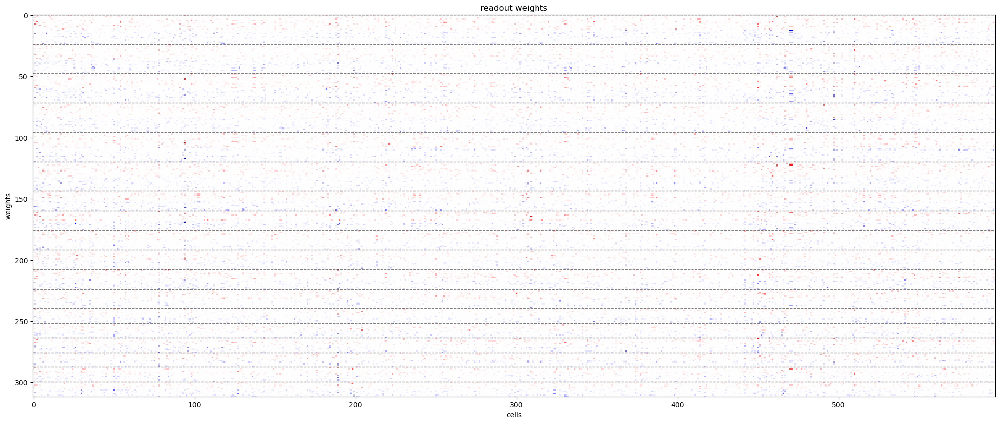

In [127]:
mplt.plot_readout_weights(model, group_orientations=True)

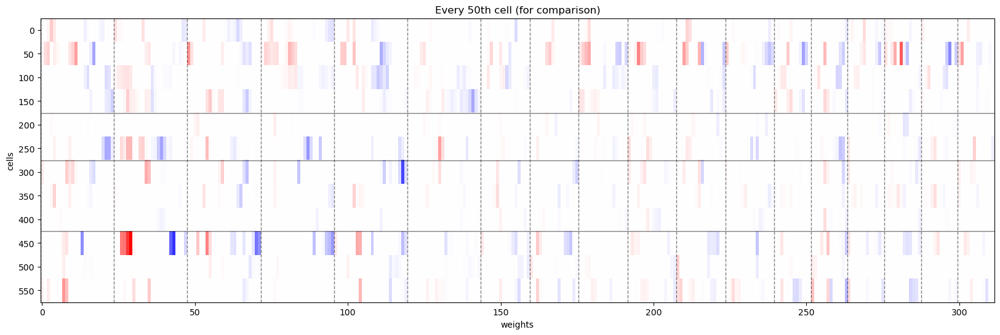

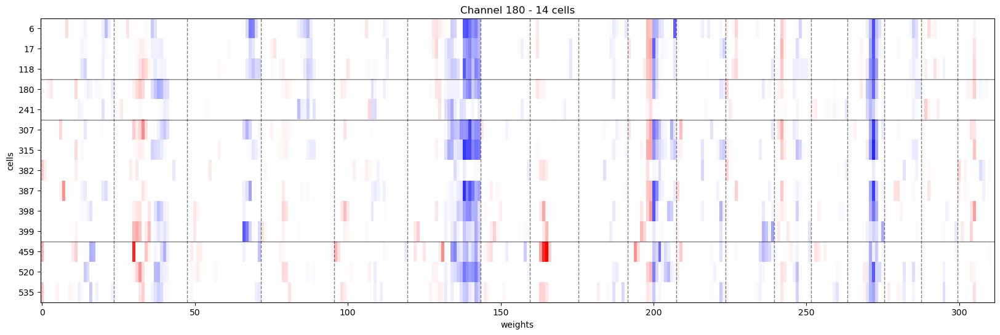

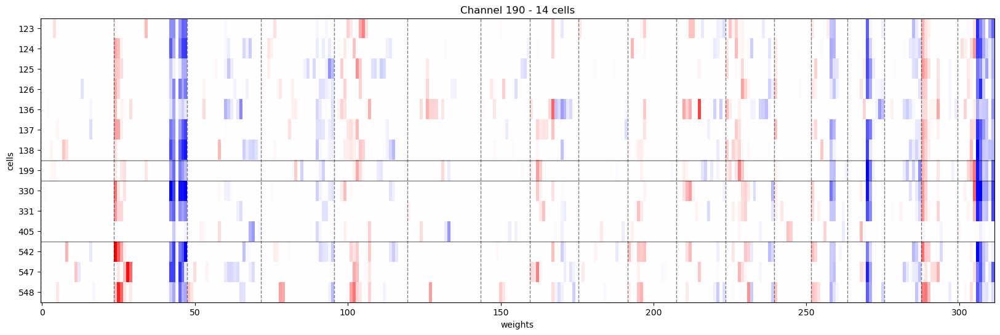

In [128]:
mplt.plot_channel_weights(model, data, expts, min_channel_size=14)

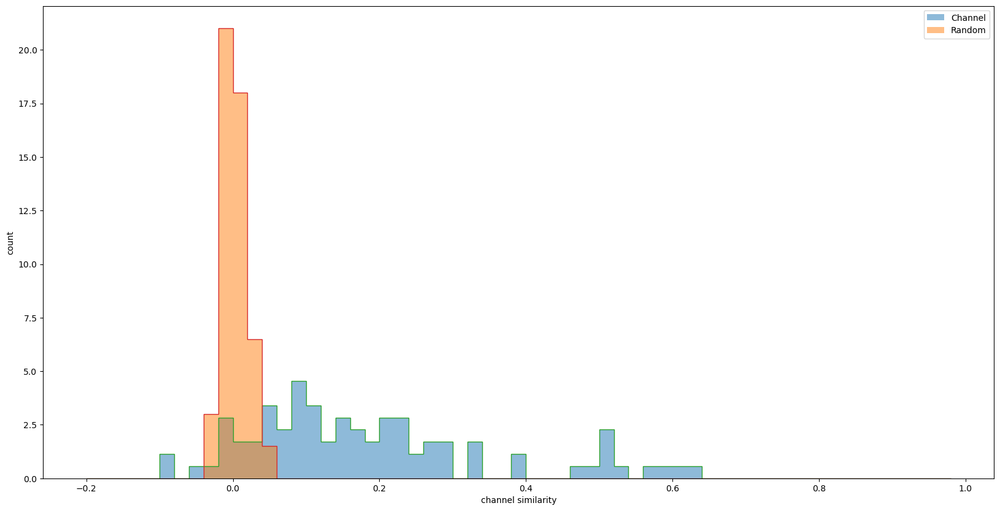

In [140]:
mplt.plot_channel_similarity(model, expts, num_random_channels=100, random_channel_size=15, min_channel_size=2, figsize=(20,10))

## aggregates

88 88


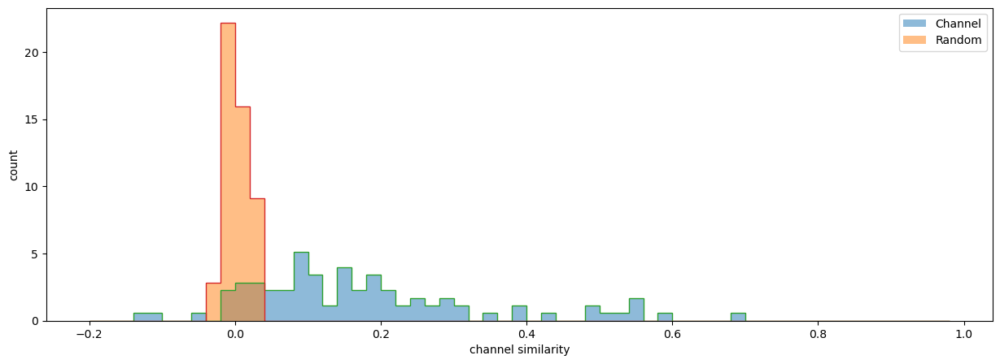

In [108]:
channel_ids, channel_scores = mplt.channel_similarity(model, expts, 
                        min_channel_size=2,
                        plot_similarity_matrices=False,
                        figsize=(15,5))

num_random_channels = 88
random_channel_size = 15
random_ids, random_scores = mplt.channel_similarity(model, expts,
                                                    random_cells=(num_random_channels, random_channel_size),
                                                    figsize=(15,5))
print(len(random_ids), len(channel_ids))

channel_mean = np.mean(channel_scores)
channel_std = np.std(channel_scores)
random_mean = np.mean(random_scores)
random_std = np.std(random_scores)

# plot the Gaussian of the channel and random scores
plt.figure(figsize=(15,5))
plt.hist(channel_scores, bins=np.arange(-0.2, 1, 0.02), density=True, alpha=0.5, label='Channel')
plt.hist(random_scores, bins=np.arange(-0.2, 1, 0.02), density=True, alpha=0.5, label='Random')
plt.hist(channel_scores, bins=np.arange(-0.2, 1, 0.02), density=True, histtype='step')
plt.hist(random_scores, bins=np.arange(-0.2, 1, 0.02), density=True, histtype='step')
plt.xlabel('channel similarity')
plt.ylabel('count')
plt.legend()
plt.show()

# # sort ids and scores by scores
# random_ids = [x for _,x in sorted(zip(random_scores, random_ids), key=lambda pair: pair[0])]
# random_scores = sorted(random_scores)
# 
# ids = random_ids + ids
# scores = random_scores + scores
# 
# # plot the channel similarities, by channel
# plt.figure(figsize=(20,5))
# plt.bar(np.arange(len(scores)), scores)
# # label the x axis with the channel numbers
# plt.xticks(np.arange(len(scores)), ids, rotation=90)
# # put a vertical line after 15
# plt.axvline(num_random_channels-0.5, color='k', linestyle='--')
# plt.xlabel('Channel')
# plt.ylabel('Similarity')
# plt.title('Channel similarity')
# plt.show()

## GQM similarity

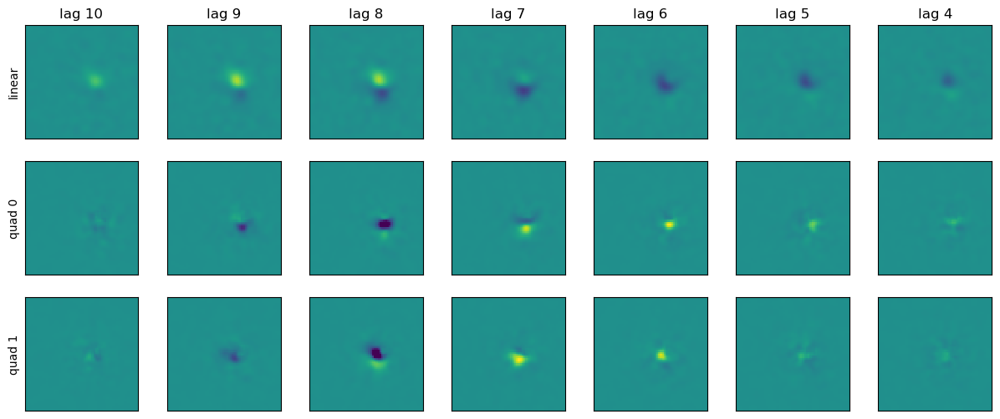

In [145]:
# load GQMs for experiment 0715
cell = 1
#gqm = NDN.load_model('/Data/ColorV1/J220707/models/UT{:03d}gqmwET.pkl'.format(cell)) # J220707
gqm = NDN.load_model('../models/dan_gqms/gqmU{:03d}.pkl'.format(cell))                # J220715
mplt.plot_gqm(gqm, figsize=(15,6))

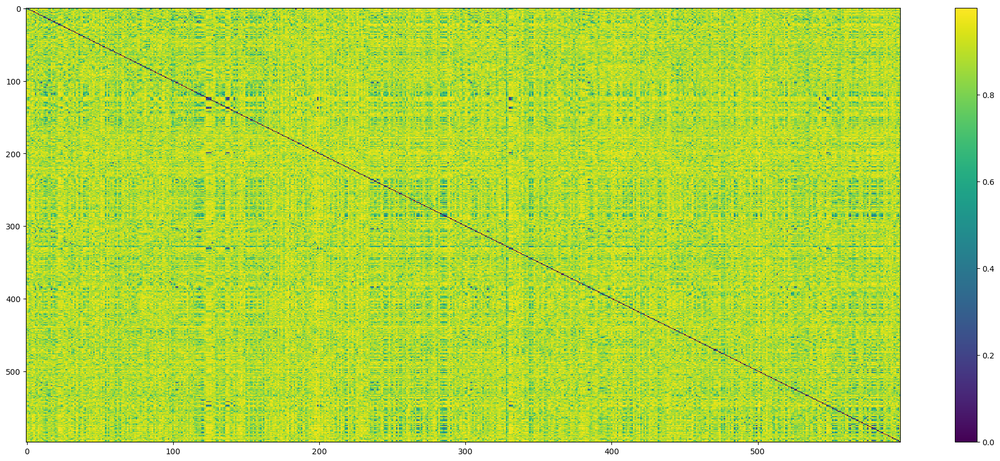

In [149]:
import pprint

channels = mplt.get_channel_weights(model,
                               expts,
                               min_channel_size=6)

# find pairs of cells with high similarity
sim = mplt.get_similarity_matrix(model, expts, min_channel_size=6)
fig = plt.figure(figsize=(25,10))
plt.imshow(sim, aspect='auto', interpolation='none')
plt.colorbar()

## within and across channels

In [164]:
import tqdm

within_channel_sims = {}
across_channel_sims = {}

#print(channel.channel_id, channel.cells)
for row in tqdm.tqdm(range(sim.shape[0])):
    for col in range(sim.shape[1]):
        for channel in channels:
            # if pair is in the channel
            if row in channel.cells and col in channel.cells:
                if (row,col) not in within_channel_sims and (col,row) not in within_channel_sims:
                    within_channel_sims[(row,col)] = sim[row,col]
            # else, if pair is not in the channel
            else:
                if (row,col) not in within_channel_sims and (col,row) not in within_channel_sims:
                    across_channel_sims[(row,col)] = sim[row,col]

len(within_channel_sims), len(across_channel_sims)

100%|███████████████████████████████████████████| 598/598 [01:19<00:00,  7.55it/s]


(2357, 355710)

In [174]:
across_channel_sims[(1,5)]

0.84987617

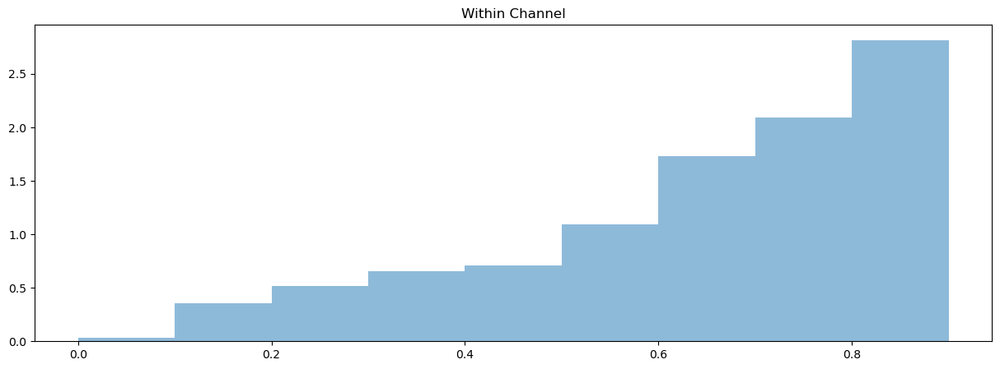

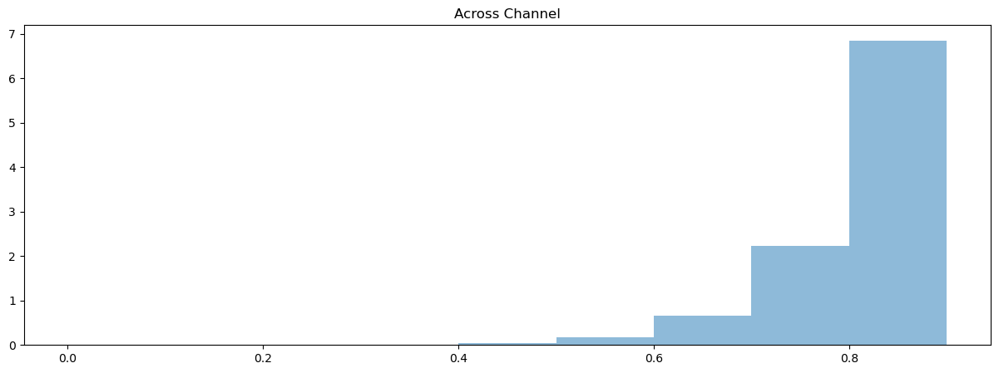

In [179]:
fig = plt.figure(figsize=(15,5))
plt.hist([v for k,v in within_channel_sims.items() if k[0] != k[1]], bins=np.arange(0, 1, 0.1), density=True, alpha=0.5, label='Within Channel')
plt.title('Within Channel')
plt.show()

fig = plt.figure(figsize=(15,5))
plt.hist([v for k,v in across_channel_sims.items() if k[0] != k[1]], bins=np.arange(0, 1, 0.1), density=True, alpha=0.5, label='Across Channel')
plt.title('Across Channel')
plt.show()

## compare GQMs

In [217]:
gqms = {}
for i in range(174):
    gqm = NDN.load_model('../models/dan_gqms/gqmU{:03d}.pkl'.format(i))
    gqms[i] = gqm

In [218]:
within_pairs = []
within_sims = []
for cell,sim in within_channel_sims.items():
    if cell[0] == cell[1]:
        continue
    if cell[0] >= 174 or cell[1] >= 174:
        continue
    print('within', cell, sim)
    within_pairs.append(cell)
    within_sims.append(sim)

across_sims = []
across_pairs = []
for cell,sim in across_channel_sims.items():
    if cell[0] == cell[1]:
        continue
    if cell[0] >= 174 or cell[1] >= 174:
        continue
    print('across', cell, sim)
    across_pairs.append(cell)
    across_sims.append(sim)

within (0, 110) 0.5743708
within (2, 111) 0.71885264
within (4, 5) 0.9165341
within (4, 8) 0.86041373
within (4, 101) 0.7129529
within (4, 112) 0.8807845
within (5, 8) 0.63484335
within (5, 101) 0.54277194
within (5, 112) 0.508904
within (6, 17) 0.18921769
within (6, 118) 0.1644187
within (8, 101) 0.8052624
within (8, 112) 0.26028
within (9, 113) 0.42851764
within (10, 102) 0.29853648
within (10, 103) 0.2873206
within (11, 114) 0.52162015
within (12, 104) 0.69961655
within (12, 105) 0.7039137
within (12, 109) 0.52009416
within (12, 115) 0.6143125
within (13, 116) 0.4380232
within (15, 16) 0.2606923
within (17, 118) 0.11455512
within (20, 21) 0.46475595
within (20, 107) 0.7689859
within (20, 108) 0.8820708
within (21, 107) 0.6087122
within (21, 108) 0.91963184
within (22, 23) 0.32546872
within (25, 37) 0.7615508
within (26, 139) 0.9532233
within (27, 130) 0.63129884
within (28, 131) 0.82833916
within (28, 140) 0.55787027
within (29, 121) 0.91072345
within (29, 142) 0.5789236
within (29,

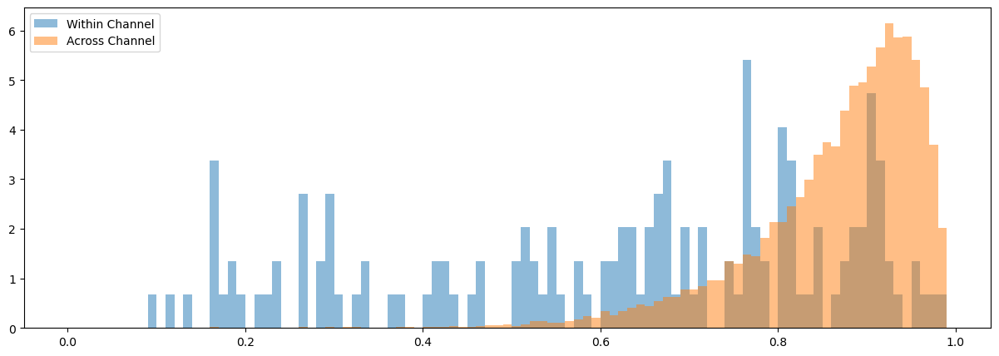

In [224]:
fig = plt.figure(figsize=(15,5))
plt.hist(within_sims, bins=np.arange(0, 1, 0.01), density=True, alpha=0.5, label='Within Channel')
plt.hist(across_sims, bins=np.arange(0, 1, 0.01), density=True, alpha=0.5, label='Across Channel')
plt.legend()
plt.show()

In [236]:
def plot_gqm_pair(gqm0, gqm1, figsize=(15,6)):
    max_weights = 0
    weights_lin = np.max(gqm0.networks[0].layers[0].get_weights())
    weights_quad = np.max(gqm0.networks[2].layers[0].get_weights())
    if weights_lin > max_weights:
        max_weights = weights_lin
    if weights_quad > max_weights:
        max_weights = weights_quad

    fig = plt.figure(figsize=figsize)
    grid = matplotlib.gridspec.GridSpec(3,14)
    for col, lag in enumerate(range(1, 8)):
        ax = fig.add_subplot(grid[0,col])
        mplt.imagesc(gqm0.networks[0].layers[0].get_weights()[:,:, -(lag+1), 0], ax=ax, max=max_weights, axis_labels=False)
        if col == 0:
            plt.ylabel('linear')
        ax.set_title('lag ' + str(lag))
    for col, lag in enumerate(range(1, 8)):
        ax = fig.add_subplot(grid[1,col])
        mplt.imagesc(gqm0.networks[2].layers[0].get_weights()[:,:, -(lag+1), 0], ax=ax, max=max_weights, axis_labels=False)
        if col == 0:
            plt.ylabel('quad 0')
    for col, lag in enumerate(range(1, 8)):
        ax = fig.add_subplot(grid[2,col])
        mplt.imagesc(gqm0.networks[2].layers[0].get_weights()[:,:, -(lag+1), 1], ax=ax, max=max_weights, axis_labels=False)
        if col == 0:
            plt.ylabel('quad 1')

    max_weights = 0
    weights_lin = np.max(gqm0.networks[0].layers[0].get_weights())
    weights_quad = np.max(gqm0.networks[2].layers[0].get_weights())
    if weights_lin > max_weights:
        max_weights = weights_lin
    if weights_quad > max_weights:
        max_weights = weights_quad
    
    for col, lag in enumerate(range(1, 8)):
        ax = fig.add_subplot(grid[0,col+7])
        mplt.imagesc(gqm1.networks[0].layers[0].get_weights()[:,:, -(lag+1), 0], ax=ax, max=max_weights, axis_labels=False)
        ax.set_title('lag ' + str(lag))
        if col == 0:
            plt.ylabel('#####')
    for col, lag in enumerate(range(1, 8)):
        ax = fig.add_subplot(grid[1,col+7])
        mplt.imagesc(gqm1.networks[2].layers[0].get_weights()[:,:, -(lag+1), 0], ax=ax, max=max_weights, axis_labels=False)
        if col == 0:
            plt.ylabel('#####')
    for col, lag in enumerate(range(1, 8)):
        ax = fig.add_subplot(grid[2,col+7])
        mplt.imagesc(gqm1.networks[2].layers[0].get_weights()[:,:, -(lag+1), 1], ax=ax, max=max_weights, axis_labels=False)
        if col == 0:
            plt.ylabel('#####')
    plt.show()

within (124, 137) 0.09782374


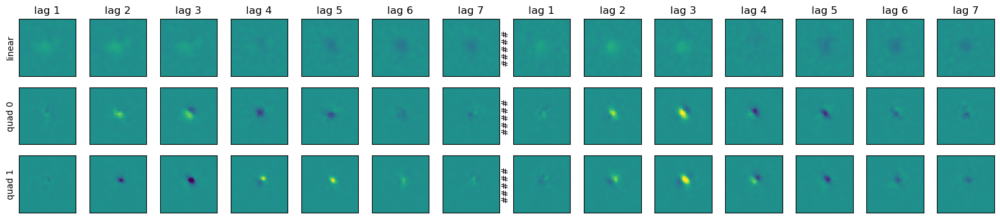

within (17, 118) 0.11455512


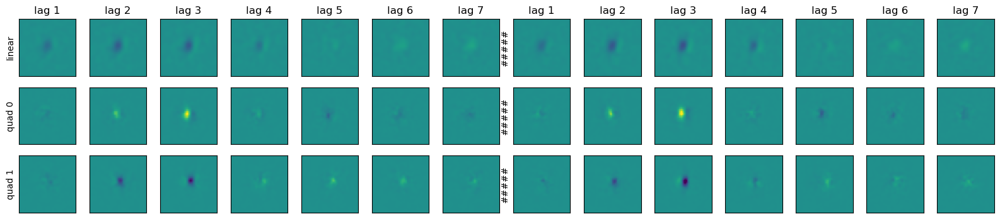

within (124, 138) 0.13045895


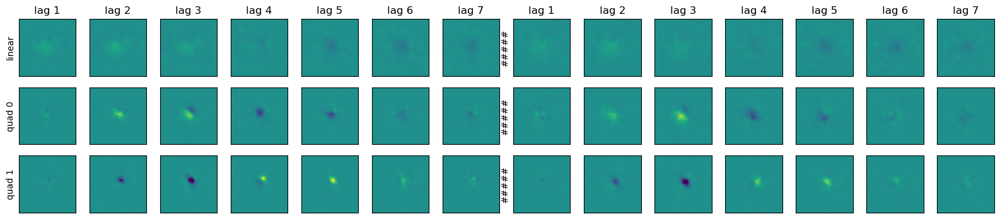

within (6, 118) 0.1644187


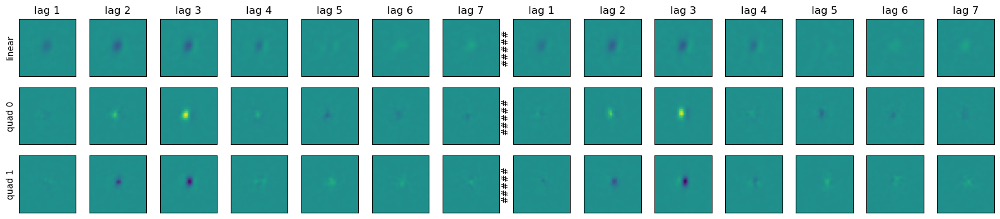

within (126, 137) 0.16505152


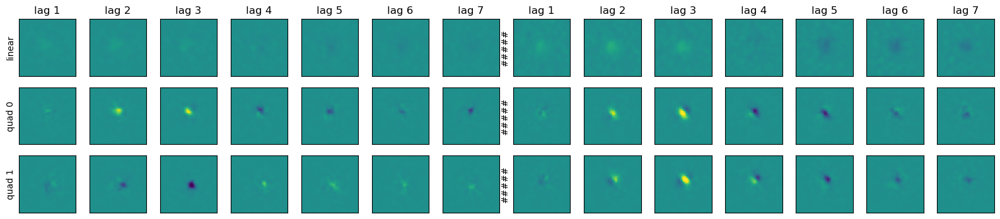

within (123, 138) 0.16650152


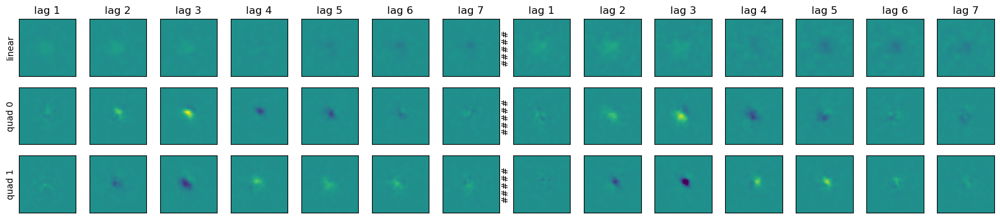

within (137, 138) 0.1673727


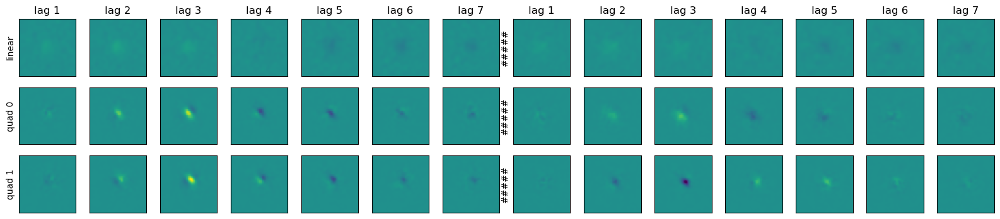

within (30, 127) 0.16903871


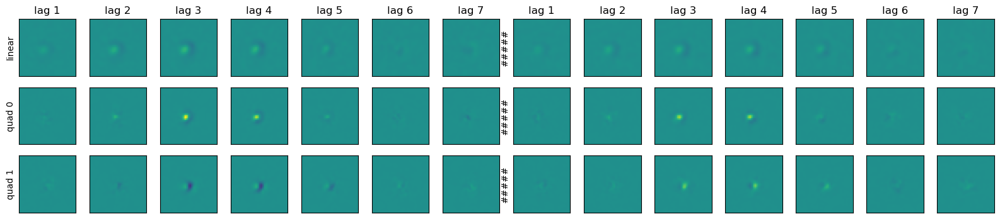

within (36, 143) 0.17625737


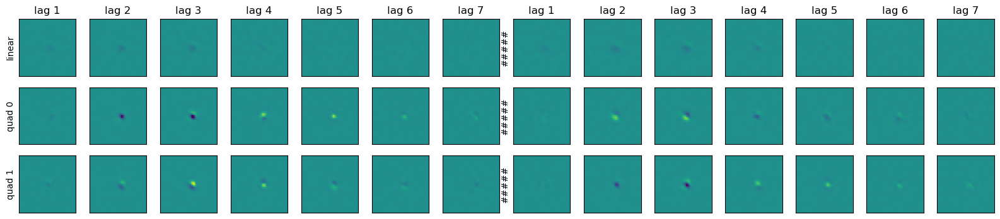

within (124, 126) 0.18825936


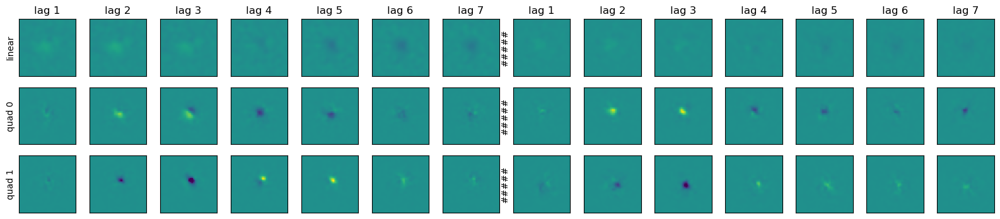

across (124, 137) 0.09782374


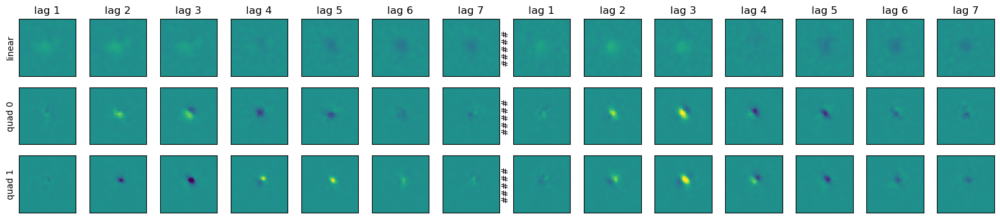

across (17, 118) 0.11455512


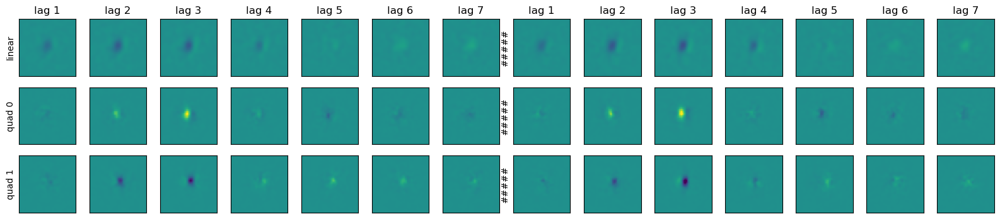

across (124, 138) 0.13045895


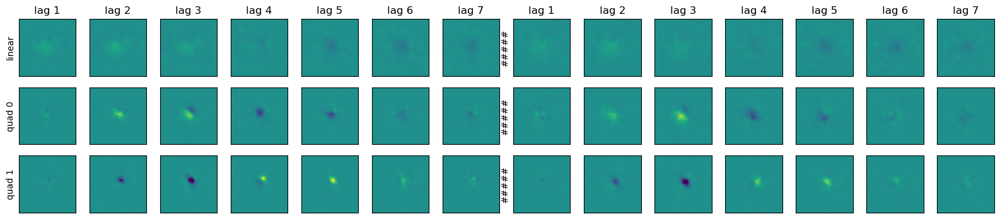

across (6, 118) 0.1644187


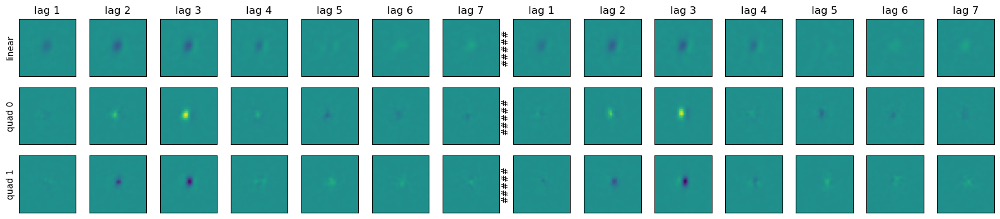

across (126, 137) 0.16505152


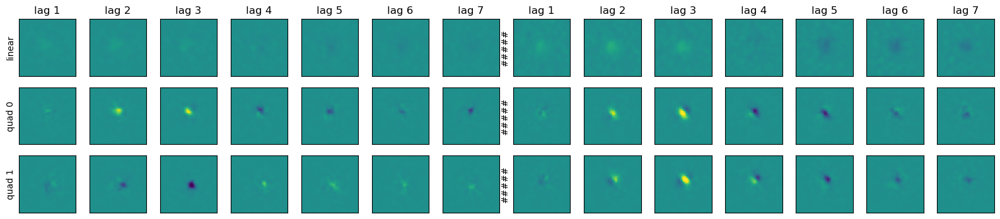

across (99, 85) 0.1653173


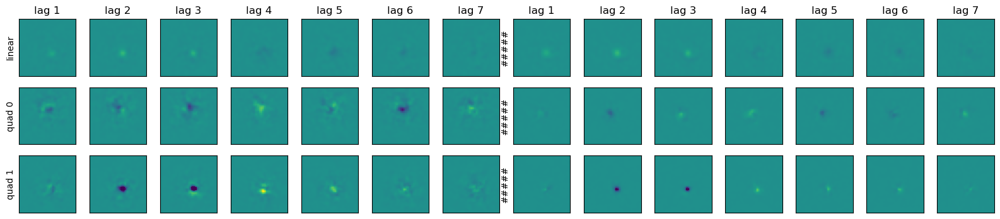

across (85, 99) 0.1653173


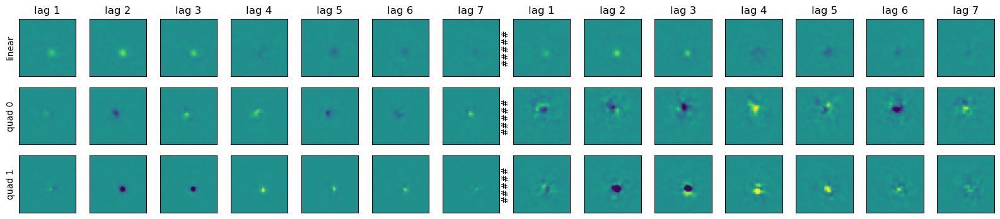

across (123, 138) 0.16650152


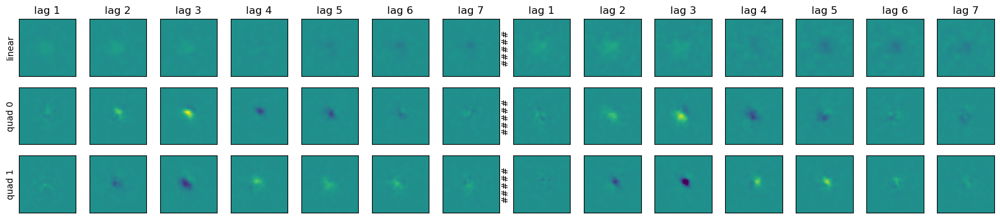

across (137, 138) 0.1673727


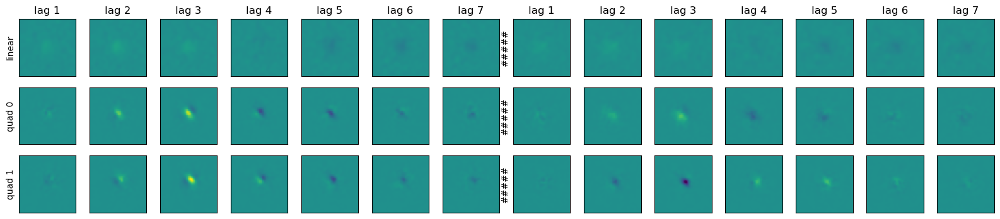

across (30, 127) 0.16903871


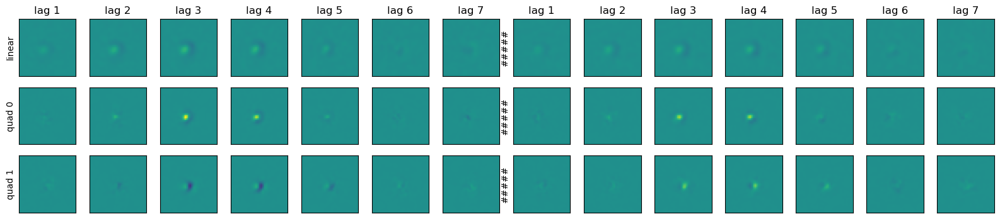

within (70, 163) 0.9822864


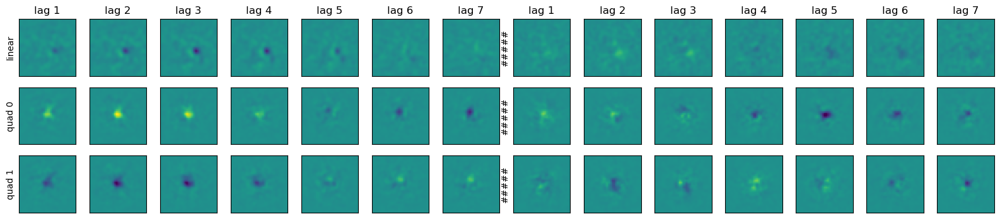

within (47, 62) 0.9704247


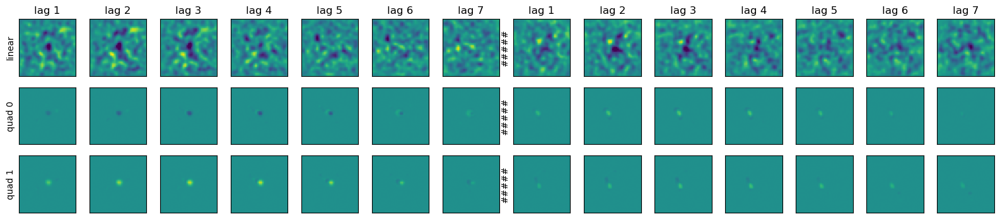

within (53, 145) 0.9650527


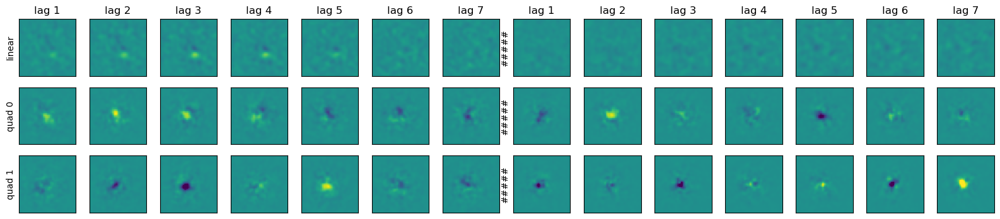

within (26, 139) 0.9532233


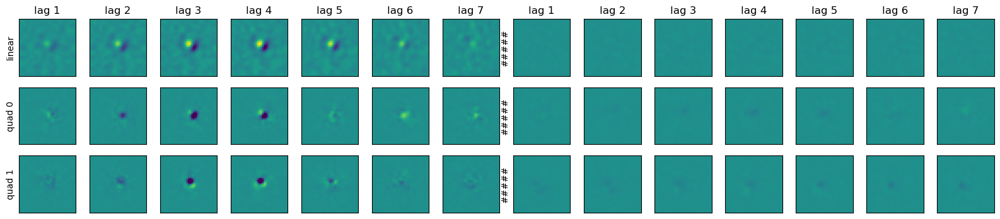

within (62, 159) 0.95178837


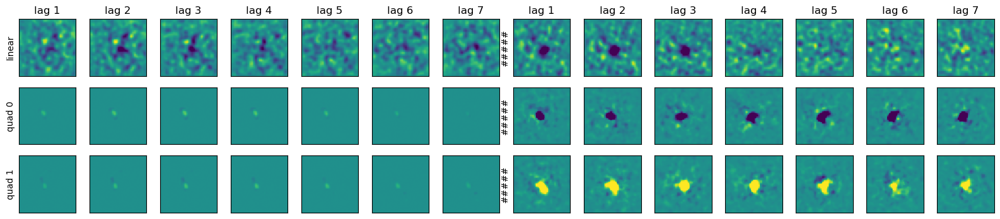

within (74, 166) 0.93080664


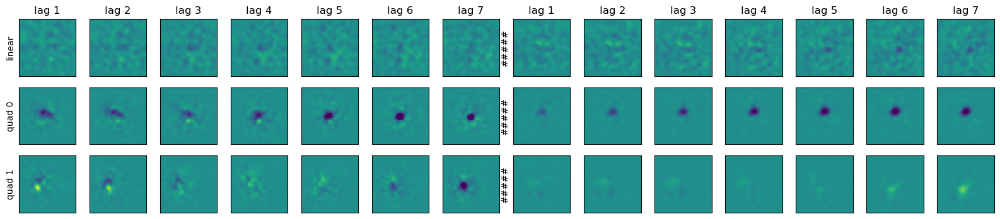

within (121, 142) 0.92357767


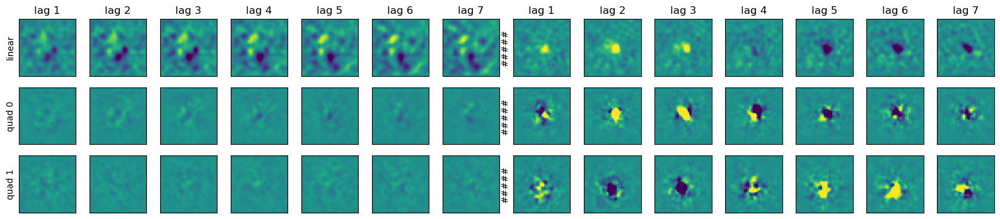

within (51, 148) 0.9209204


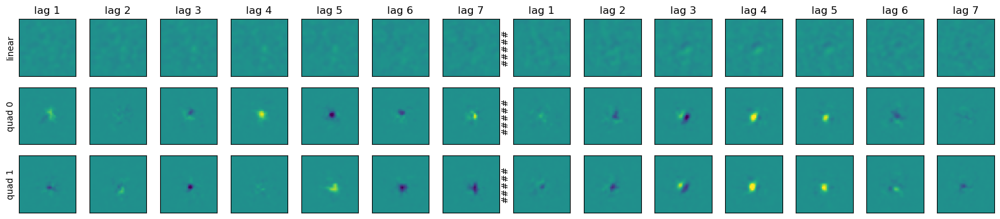

within (21, 108) 0.91963184


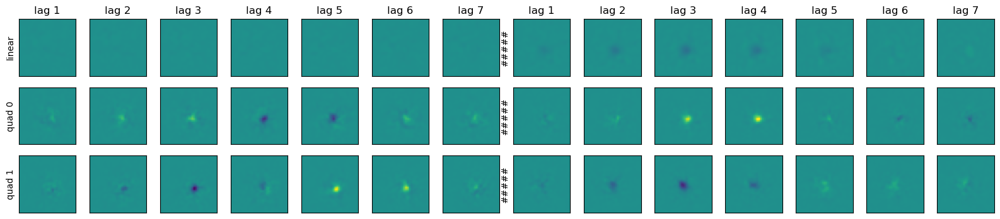

within (158, 159) 0.9190733


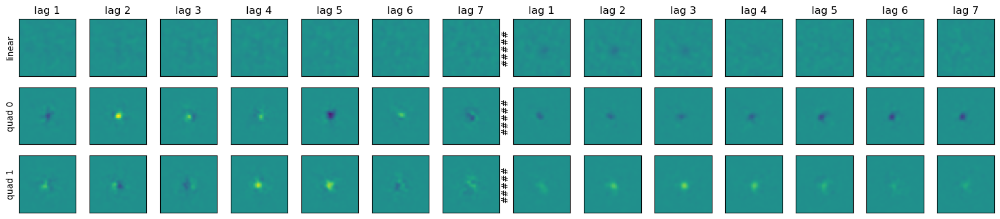

across (33, 35) 0.99945325


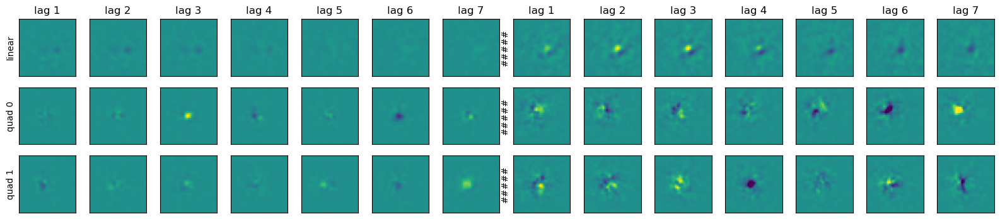

across (35, 33) 0.99945325


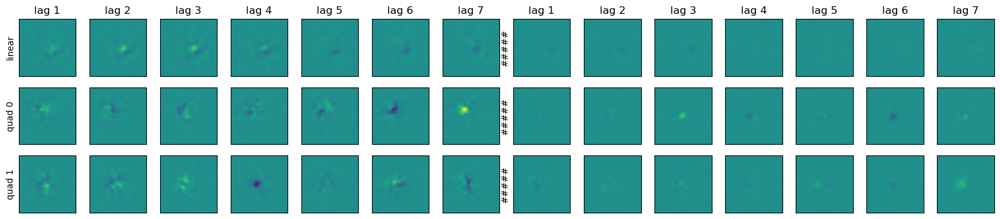

across (92, 45) 0.999145


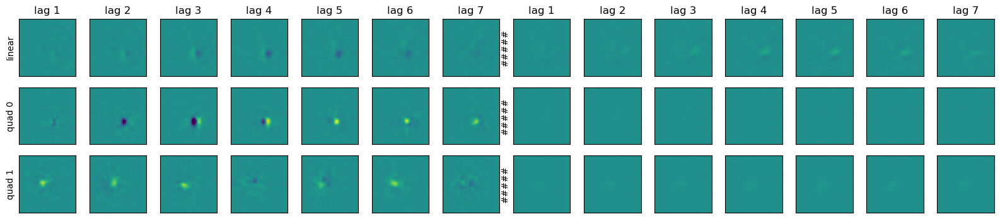

across (45, 92) 0.999145


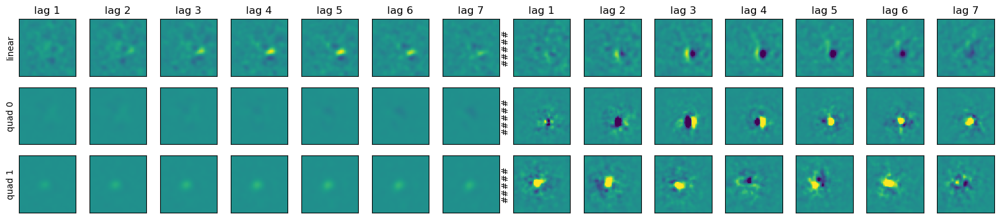

across (87, 38) 0.99894816


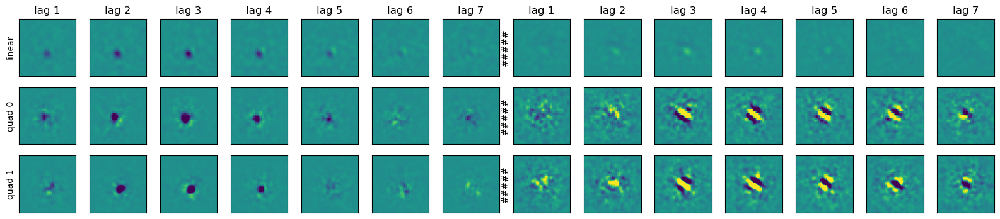

across (38, 87) 0.99894816


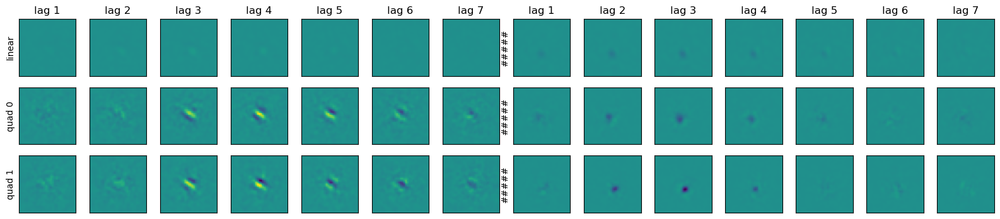

across (139, 13) 0.9983923


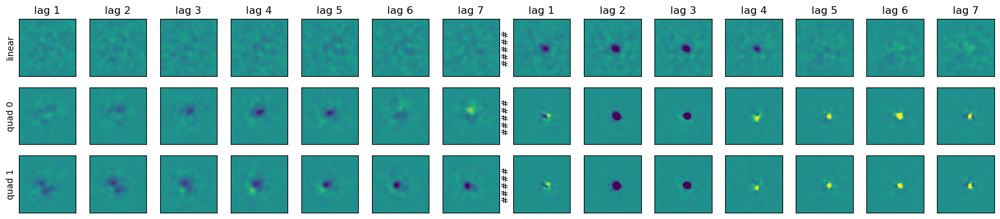

across (13, 139) 0.9983923


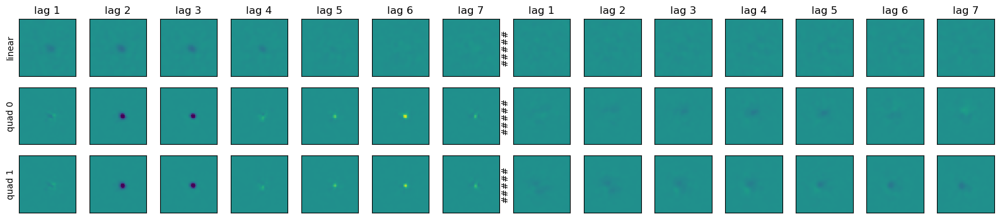

across (147, 2) 0.99784756


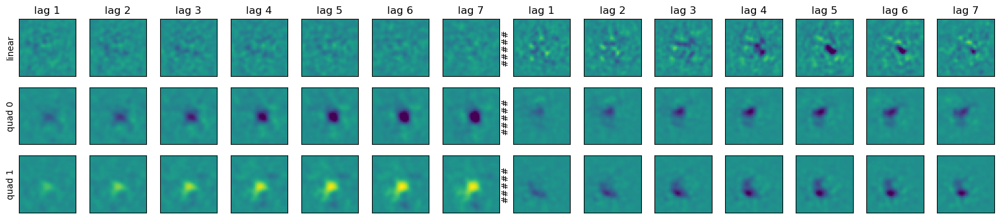

across (2, 147) 0.99784756


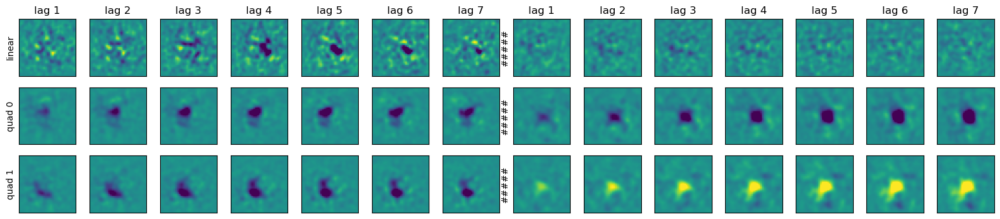

In [239]:
# get the smallest within and across channel similarities
# iterate over the smallest within and across channel similarities
for i in np.argsort(within_sims)[:10]:
    print('within', within_pairs[i], within_sims[i])
    min_within_pair = within_pairs[i]
    min_within_gqm0 = NDN.load_model('../models/dan_gqms/gqmU{:03d}.pkl'.format(min_within_pair[0]))
    min_within_gqm1 = NDN.load_model('../models/dan_gqms/gqmU{:03d}.pkl'.format(min_within_pair[1]))
    plot_gqm_pair(min_within_gqm0, min_within_gqm1, figsize=(20,4))

for i in np.argsort(across_sims)[:10]:
    print('across', across_pairs[i], across_sims[i])
    min_across_pair = across_pairs[i]
    min_across_gqm0 = NDN.load_model('../models/dan_gqms/gqmU{:03d}.pkl'.format(min_across_pair[0]))
    min_across_gqm1 = NDN.load_model('../models/dan_gqms/gqmU{:03d}.pkl'.format(min_across_pair[1]))
    plot_gqm_pair(min_across_gqm0, min_across_gqm1, figsize=(20,4))

##########################################################################################
for i in np.argsort(within_sims)[::-1][:10]:
    print('within', within_pairs[i], within_sims[i])
    min_within_pair = within_pairs[i]
    min_within_gqm0 = NDN.load_model('../models/dan_gqms/gqmU{:03d}.pkl'.format(min_within_pair[0]))
    min_within_gqm1 = NDN.load_model('../models/dan_gqms/gqmU{:03d}.pkl'.format(min_within_pair[1]))
    plot_gqm_pair(min_within_gqm0, min_within_gqm1, figsize=(20,4))

for i in np.argsort(across_sims)[::-1][:10]:
    print('across', across_pairs[i], across_sims[i])
    min_across_pair = across_pairs[i]
    min_across_gqm0 = NDN.load_model('../models/dan_gqms/gqmU{:03d}.pkl'.format(min_across_pair[0]))
    min_across_gqm1 = NDN.load_model('../models/dan_gqms/gqmU{:03d}.pkl'.format(min_across_pair[1]))
    plot_gqm_pair(min_across_gqm0, min_across_gqm1, figsize=(20,4))


# compare model perfs

ScaffoldNetwork
	STconvLayer	(9, 9, 14, 4)	{'d2t': 0.01, 'edge_t': 100}
	OriConvLayer	(4, 17, 17, 20)	{'center': 0.0001}
	ConvLayer3D	(20, 7, 7, 16)	{}
	ConvLayer3D	(16, 5, 5, 16)	{}
ReadoutNetwork
	ReadoutLayer	(312, 598)	{'max': 0.0001}
FFnetwork
	NDNLayer	(158, 598)	{'d2t': 0.5}
FFnetwork
	ChannelLayer	(598,)	{}
model_20_16.pkl 0.0313 [598, 1, 1, 1]

Expt 	 LLs:
0 	 0.0306
1 	 0.0292
2 	 0.0199
3 	 0.0453
weights (4, 17, 17, 20)


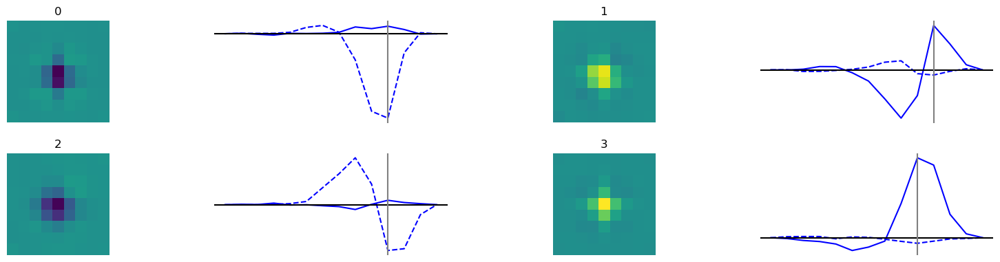

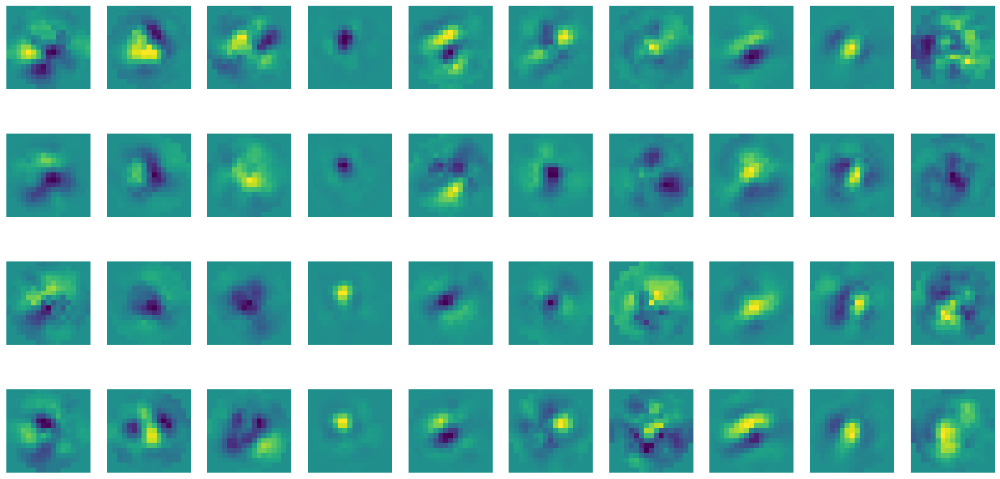

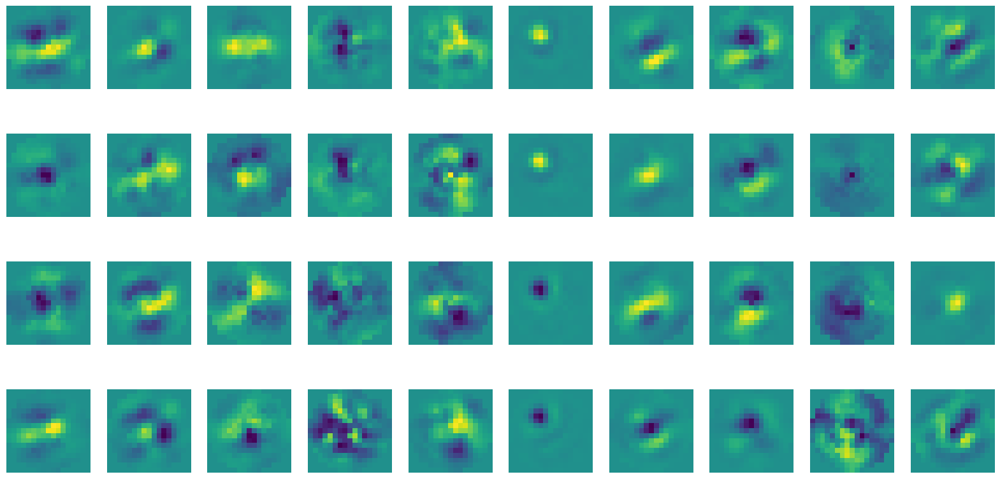

---------------------------------
ScaffoldNetwork
	STconvLayer	(9, 9, 14, 4)	{'d2t': 0.01, 'edge_t': 100}
	ConvLayer	(4, 17, 17, 16)	{'center': 0.0001}
	ConvLayer	(16, 7, 7, 12)	{}
	ConvLayer	(12, 5, 5, 12)	{}
ReadoutNetwork
	ReadoutLayer	(40, 598)	{'max': 0.0001}
FFnetwork
	NDNLayer	(158, 598)	{'d2t': 0.5}
FFnetwork
	ChannelLayer	(598,)	{}
model_16_12.pkl 0.025 [598, 1, 1, 1]

Expt 	 LLs:
0 	 0.0234
1 	 0.0233
2 	 0.0155
3 	 0.0381
weights (4, 17, 17, 16)


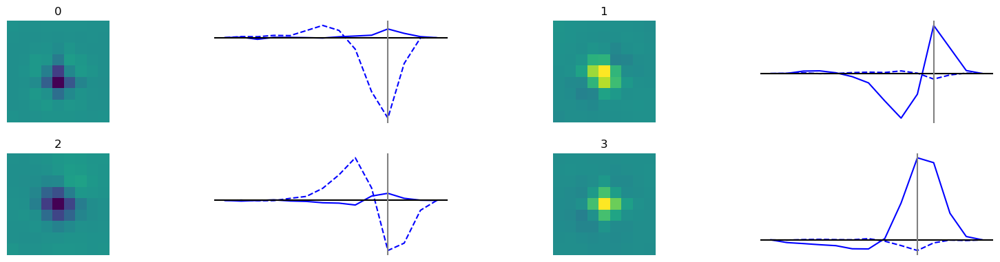

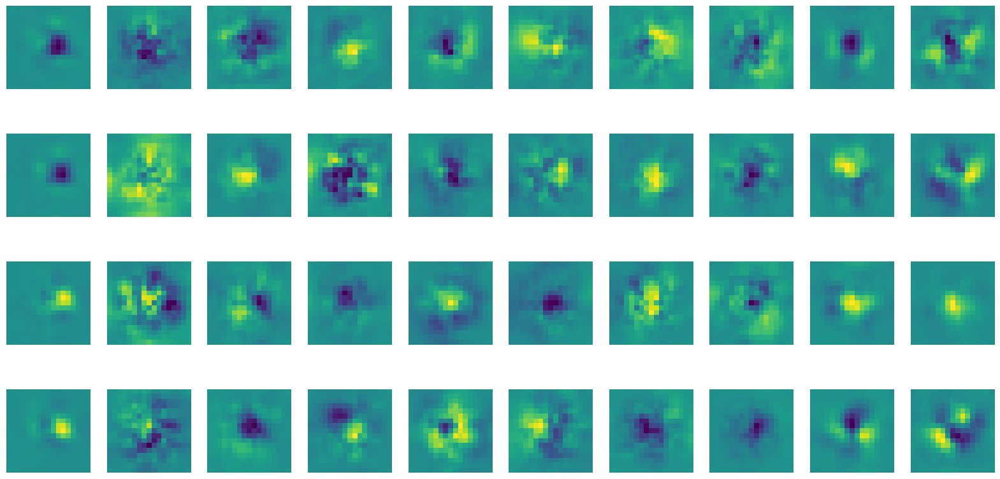

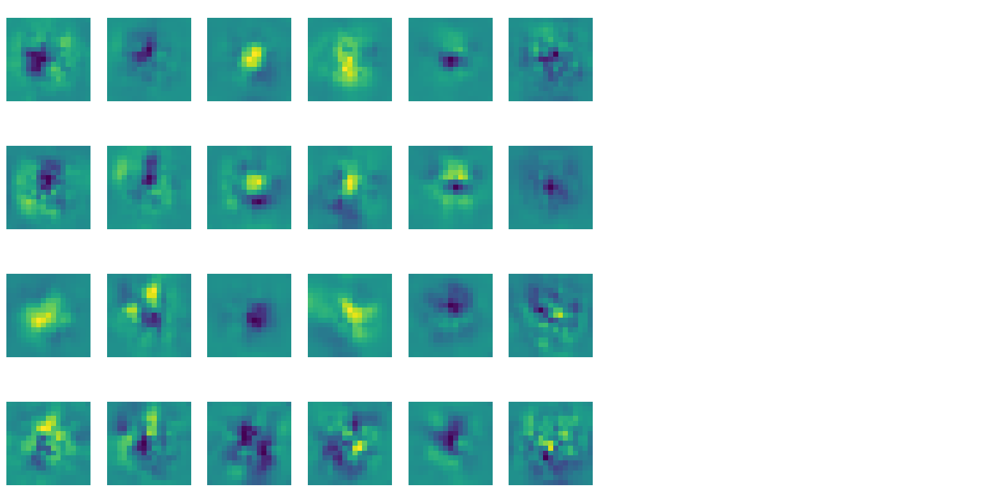

---------------------------------


In [238]:
num_rows = 4
num_cols = 16
models = {}
for fname in ['../models/ori_06a/model_20_16.pkl', '../models/ori_06b/model_16_12.pkl']:
    # load LLs
    LLs = np.load(fname.split('.pkl')[0]+'.npy')
    model = NDN.load_model(fname)
    #layer_num_inhs, layer_heights, layer_bounds, readout_weights = mplt.get_readout_weights(model)
    print(mprint.model_summary(model))
    model.plot_filters()
    models[os.path.basename(fname)] = model
    print(os.path.basename(fname), np.round(np.mean(LLs), 4), end=' ')
    print(model.networks[-1].layers[-1].output_dims)
    print()
    print('Expt \t LLs:')
    for i, (start,end) in enumerate(expts.experiment_boundaries):
        print(i, '\t', np.round(np.mean(LLs[start:end]), 4))
    mplt.plot_proj_filters(model, num_cols=10, figsize=(20,10), sample='all', verbose=True)
    print('---------------------------------')